# In this model we want to do the following:
- Model the white light curve for both visits
- Use fit results to fix the ramp and breathing parameters

In [2]:
import os
import jax
import jax.numpy as jnp
from jax import pmap, devices

# Force CPU mode to avoid the Metal version mismatch
os.environ['JAX_PLATFORMS'] = 'cpu'
os.environ['XLA_FLAGS'] = '--xla_force_host_platform_device_count=8'

# Clear any cached backends
jax.config.update('jax_platform_name', 'cpu')

# Now check devices
print("Available devices:", devices())
print("CPU devices:", devices('cpu'))

import warnings
warnings.filterwarnings("ignore", message="It appears that you're using a Mac with one of Apple's ARM-based processors")

# We need to import numpyro first (though we use it last)
import numpyro
from numpyro.infer import MCMC, NUTS
from numpyro import distributions as dist
# N_cores = 18
# numpyro.set_host_device_count(N_cores)

from preamble_jax import *

Available devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
CPU devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]


2025-09-22 21:00:23,432 - WARNING - File .dacerc not found. You are requesting data in public mode. To change this behaviour, create a .dacerc file in your home directory and fill it with your API key. More infos on https://dace.unige.ch


🌈🤖 It looks like you're trying to bin in wavelength for a
`Rainbow` object that might not be normalized. In the
current version of `chromatic`, binning before normalizing
might give inaccurate results if the typical uncertainty
varies strongly with wavelength.

Please consider normalizing first, for example with
`rainbow.normalize().bin(...)`
so that all uncertainties will effectively be relative,
and the inverse variance weighting used for binning
wavelengths together will give more reasonable answers.

If you really need to bin before normalizing, please submit
an Issue at github.com/zkbt/chromatic/, and we'll try to
prioritize implementing a statistically sound solution as
soon as possible!



  0%|          | 0/160 [00:00<?, ?it/s]

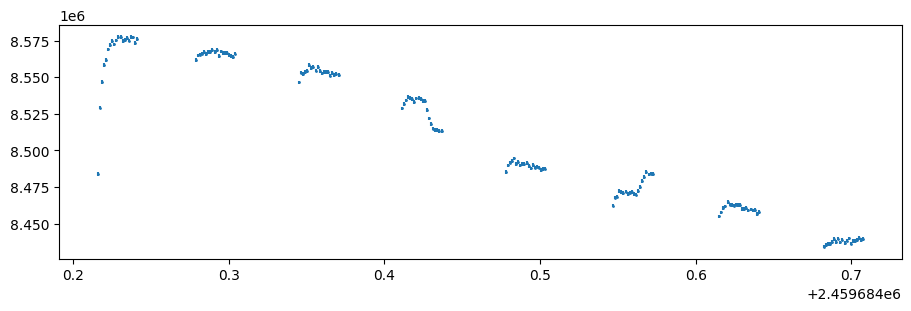

<Figure size 640x480 with 0 Axes>

In [3]:
visit = 'S22'

orbits_to_exclude = np.array([0,2,7])
speclc_bin_edges = F21_speclc_bin_edges if visit=='F21' else S22_speclc_bin_edges
speclc_err_factor = F21_speclc_bin_err_factor if visit=='F21' else S22_speclc_err_factor
SED_err_factor = F21_SED_err_factor if visit=='F21' else S22_SED_err_factor

predicted_T0 = visits[f'{visit}']['T0 (BJD_TDB)'].value
binwidth = visits[f'{visit}']['native resolution']
exptime = visits[f'{visit}']['exp (s)']
grism = visits[f'{visit}']['Grism']
_rainbow = read_rainbow(f"../data/{visit}_scan-combined_trimmed_pacman_spec.rainbow.npy")
rainbow = _rainbow
for i in range(len(_rainbow.wavelength.value)):
    rainbow.uncertainty[i,:] = _rainbow.uncertainty[i,:] * SED_err_factor[i]
speclc_rainbow = rainbow.bin(wavelength_edges = speclc_bin_edges)
for i in range(len(speclc_rainbow.wavelength)):
    speclc_rainbow.uncertainty[i,:] = speclc_rainbow.uncertainty[i,:] * speclc_err_factor[i]

# trim_spots = ( _speclc_rainbow.mask_transit(period=8.463*u.day, t0=(predicted_T0+0.027)*u.day, duration=0.075*u.day).trim() )

# trim_spots.imshow()
# plt.show()
# plt.clf()

# speclc_rainbow = trim_spots.trim()
# speclc_rainbow.time = speclc_rainbow.time + (predicted_T0+0.027)*u.day

# Check a light curve to verify the spots are getting trimmed
plt.figure(figsize=(9,3))
plt.errorbar(speclc_rainbow.time,speclc_rainbow.flux[10,:],speclc_rainbow.uncertainty[10,:],
            fmt='o',ms=1)
plt.show()
plt.clf()

Median relative photon uncertainty at 0.8103 micron = 313ppm
Median relative photon uncertainty at 0.8194 micron = 375ppm
Median relative photon uncertainty at 0.8267 micron = 313ppm
Median relative photon uncertainty at 0.8501 micron = 442ppm
Median relative photon uncertainty at 0.8747 micron = 214ppm
Median relative photon uncertainty at 0.8845 micron = 212ppm
Median relative photon uncertainty at 0.8968 micron = 166ppm
Median relative photon uncertainty at 0.9079 micron = 222ppm
Median relative photon uncertainty at 0.9165 micron = 184ppm
Median relative photon uncertainty at 0.9275 micron = 172ppm
Median relative photon uncertainty at 0.9411 micron = 145ppm
Median relative photon uncertainty at 0.9546 micron = 261ppm
Median relative photon uncertainty at 0.9644 micron = 192ppm
Median relative photon uncertainty at 0.9706 micron = 248ppm
Median relative photon uncertainty at 0.9755 micron = 230ppm
Median relative photon uncertainty at 0.9816 micron = 185ppm
Median relative photon u

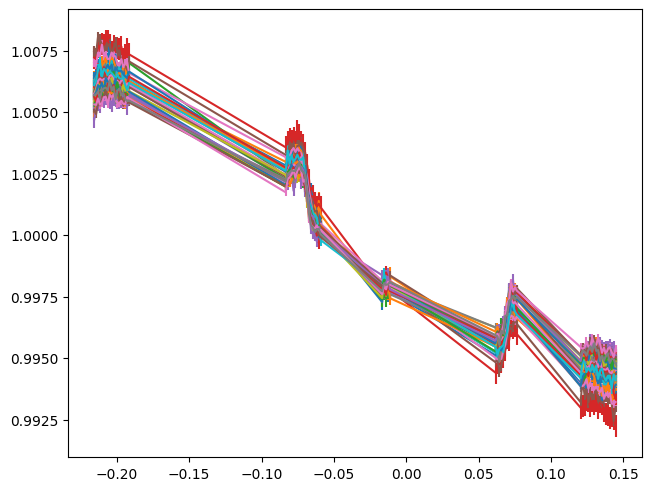

In [4]:
data_wavelengths = speclc_rainbow.wavelength.value
img_date = speclc_rainbow.time.value
data_flux = speclc_rainbow.flux.value
relative_err = speclc_rainbow.uncertainty.value/data_flux
time_from_T0 = img_date - predicted_T0

for i in range(len(data_wavelengths)):
    print(f'Median relative photon uncertainty at {data_wavelengths[i]:.4f} micron = {int(np.nanmedian(relative_err[i,:])*1e6)}ppm')

_w, _s, _e = read_sensitivity_curve(grism=grism)
binned_filter_response = bintogrid(_w.value, _s.value, newx=data_wavelengths)['y'] * u.cm**2 / u.erg

for i,date in enumerate(img_date):
    e_per_s = data_flux[:,i] / exptime
    e_per_s_per_angstrom = e_per_s / binwidth
    calibrated_flux = (e_per_s_per_angstrom.flatten() / binned_filter_response)
    data_flux[:,i] = calibrated_flux.value

# Label the orbits
orbit = np.zeros_like(img_date)
for j in range(len(img_date)):
    if j >= 1:
        if (img_date[j] - img_date[j - 1]) > 0.01:
            orbit[j] = (orbit[j - 1] + 1)
        else:
            orbit[j] = orbit[j - 1]

# Trim the first point from each orbit
ref_time = []
for o in np.unique(orbit):
    first_index = np.where(orbit == o)[0][0]
    ref_time.append(img_date[first_index])
    data_flux[:, first_index] = np.nan  # Set the first point of each subsequent orbit to np.nan
    relative_err[:, first_index] = np.nan
    img_date[first_index] = np.nan
    time_from_T0[first_index] = np.nan

time_from_T0[86:108] = np.nan

# Set data to nan if it was in the pre-defined list of orbits to exclude
for orbit_to_exclude in orbits_to_exclude:
    data_flux[:, orbit == orbit_to_exclude] = np.nan
    relative_err[:, orbit == orbit_to_exclude] = np.nan
    img_date[orbit == orbit_to_exclude] = np.nan
    time_from_T0[orbit == orbit_to_exclude] = np.nan

# Populate ramp_phase time arrays
phase_list=[]
for o in [0,1,2,3,4,5,6,7]:
    rphase = (img_date[orbit==o] - ref_time[o]) / 0.066
    phase_list.append(rphase)
ramp_phase = np.concatenate(phase_list)
breathing_phase = ( (img_date-ref_time[0]+0.02) / 0.066 ) % 1

# Convert all arrays to JAX arrays

data_flux = jnp.array( data_flux[:,~np.isnan(time_from_T0)] )
_relative_err = jnp.array(relative_err[:,~np.isnan(time_from_T0)] )
img_date = jnp.array(img_date[~np.isnan(time_from_T0)] )
# ramp_phase = jnp.array(ramp_phase[~np.isnan(ramp_phase)] )
ramp_phase = jnp.array(ramp_phase[~np.isnan(time_from_T0)] )
# breathing_phase = jnp.array(breathing_phase[~np.isnan(breathing_phase)] )
breathing_phase = jnp.array(breathing_phase[~np.isnan(time_from_T0)] )

time_from_T0 = jnp.array(time_from_T0[~np.isnan(time_from_T0)] )

mean_per_wavelength = jnp.mean(data_flux, axis=1, keepdims=True)
normalized_data_flux = data_flux / mean_per_wavelength
relative_err = _relative_err * normalized_data_flux
jax_rel_err = relative_err
jax_flux = normalized_data_flux

planet_parameters = dict(
    inclination = jnp.radians(89.5),
    a = 19.2, #default_params['a_rstar'],
    rp = 0.047,
    period = 8.46,
    t0 = 0,
    ecc = 0.0,
    u1 = 0.25,
    u2 = 0.15)

# initial_lons = jnp.array(np.random.uniform(-2.8,2.8,n_spots))
# jnp.save('../data/initial_lons',initial_lons)
# initial_lats = jnp.array(random.choice( [np.random.beta(2, 1,n_spots)*(1.25 - 0.2) + 0.2, np.random.beta(1,2,n_spots)*(3.0 - 2.0) + 2.0 ]))
# jnp.save('../data/initial_lats',initial_lats)
# initial_radii = jnp.array([0.005]*n_spots)

for i in range(len(data_wavelengths)):
    plt.errorbar(time_from_T0, normalized_data_flux[i,:], relative_err[i,:])

In [5]:
def numpyro_model():

    """
    Define the probabilistic model in NUMPYRO
    """
    params = {}

    # Instrument Parameters
    params['r_1'] = 15.64 #numpyro.sample('r_1', dist.Uniform(7.0, 18.0))
    params['r_2'] = -7.398#numpyro.sample('r_2', dist.Uniform(-8, -1))
    params['r_3'] = 0.041 #numpyro.sample('r_3', dist.Uniform(0.02,0.06))  

    # Instrument Parameters
    params['b_1'] = -0.029 #numpyro.sample('b_1', dist.Uniform(-0.08,0.08))
    params['b_2'] = -0.017 #numpyro.sample('b_2', dist.Uniform(-0.2,0.2))
    params['b_3'] = 0.005 #numpyro.sample('b_3', dist.Uniform(-0.3,0.3)) 
    params['b_4'] = 0.003 #numpyro.sample('b_4', dist.Uniform(-0.15,0.1)) 

    # params['HST_period'] = numpyro.sample('HST_period', dist.Uniform(0.0645,0.0675)))

    # Baseline Parameters
    params['linear_slope'] = numpyro.sample('linear_slope', dist.Uniform(-0.15, 0))
    params['rot_spot_lat'] = 1.25 #numpyro.sample('spot_lat', dist.Uniform(0.5, 1.7))
    params['rot_spot_lon'] = 0 #numpyro.sample('rot_spot_lon', dist.Uniform(-1.4, -0.4))
    params['rot_spot_rad'] = 0 #numpyro.sample('rot_spot_rad', dist.Uniform(0.0, 0.4))
    # params['rot_spot_2_lon'] = numpyro.sample('rot_spot_2_lon', dist.Uniform(-2.0, -1.4))

    # Planet Parameters
    params['rp_rs'] = numpyro.sample('rp_rs', dist.Uniform(0.0, 0.1))
    params['t_0'] = 0.00035 #numpyro.sample('t_0', dist.Uniform(0, 0.0015)) 
    params['a'] = 19.15 #numpyro.sample('a', dist.Uniform(18.0, 20.0))
    
    params['u1'] = numpyro.sample('u1', dist.Uniform(0.0,1.0))
    params['u2'] = numpyro.sample('u2', dist.Uniform(0.0,1.0))
    
    # Stellar Parameters
    # params['T_phot'] = 4200
    # params['T_spot'] = 3500 #numpyro.sample('T_spot', dist.Uniform(3000,3600))
    beta = 0#numpyro.sample('beta', dist.Uniform(0, 0.3))

    @jit
    def broadband_transit(params,**kwargs):

         # Calculate systematics model
        ramp = ramp_model_jax(phase=ramp_phase,
                        r1=jnp.asarray(params['r_1'], dtype=jnp.float64),
                        r2=jnp.asarray(params['r_2'], dtype=jnp.float64),
                        r3=jnp.asarray(params['r_3'], dtype=jnp.float64) )
        breathing = breathing_model_jax(phase=breathing_phase,
                                  b1=jnp.asarray(params['b_1'], dtype=jnp.float64),
                                  b2=jnp.asarray(params['b_2'], dtype=jnp.float64),
                                  b3=jnp.asarray(params['b_3'], dtype=jnp.float64),
                                  b4=jnp.asarray(params['b_4'], dtype=jnp.float64))
        
        linear_baseline = linear_model_jax(x=time_from_T0,
                                           m=jnp.asarray(params['linear_slope'], dtype=jnp.float64) )
        _systematics = (breathing * ramp * linear_baseline)
        systematics = _systematics/jnp.mean(_systematics)
        
        # Update Planet Parameters
        planet_parameters = dict(
            inclination = jnp.radians(89.5),
            a = jnp.asarray(params['a'], dtype=jnp.float64),
            rp = jnp.asarray(params['rp_rs'], dtype=jnp.float64),
            period = 8.46,
            t0 = jnp.asarray(params['t_0'], dtype=jnp.float64),
            ecc = 0.0,
            u1 = jnp.asarray(params['u1'], dtype=jnp.float64),
            u2 = jnp.asarray(params['u2'], dtype=jnp.float64))
        
        # Get spectra for the model temps
        Phot = get_binned_BTSettl_spectrum_jax(T=4200,data_wave = data_wavelengths)
        Cool = get_binned_BTSettl_spectrum_jax(T=3500,data_wave = data_wavelengths)
        
        # Update stellar parameters
        active_star = ActiveStar(
        times = time_from_T0,
        inclination=jnp.radians(89.5),
        T_eff=jnp.asarray(4200, dtype=jnp.float64),
        wavelength=Phot[0]*1e-6, # m
        phot=Phot[1],
        P_rot=4.863)
        
        active_star.spectrum = jnp.concatenate([
        jnp.vstack([Cool[1],Cool[1]]),
        ])
        active_star.temperature = jnp.concatenate([
            jnp.array([3500,3500]),
        ])
        active_star.lon = jnp.concatenate([
            jnp.array([params['rot_spot_lon'], params['rot_spot_lon']]),
        ])
        active_star.lat = jnp.concatenate([
            jnp.array([params['rot_spot_lat'], params['rot_spot_lat']]),
        ])

        active_star.rad = jnp.concatenate([
            jnp.array([params['rot_spot_rad'], params['rot_spot_rad']]),
        ])        
        
        lc, contam, X, Y, spectrum_at_transit = active_star.transit_model(**planet_parameters)        
        lc_model = lc.T[lc_index] * systematics
        mean_per_wavelength = jnp.mean(lc_model)
        normalized_model = lc_model / mean_per_wavelength
    
        return normalized_model

    numpyro.sample(
        "Obs", dist.Normal(
            loc=broadband_transit(params), 
            scale=(10**beta)*data_unc,
        ), obs=relative_flux
    )

  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


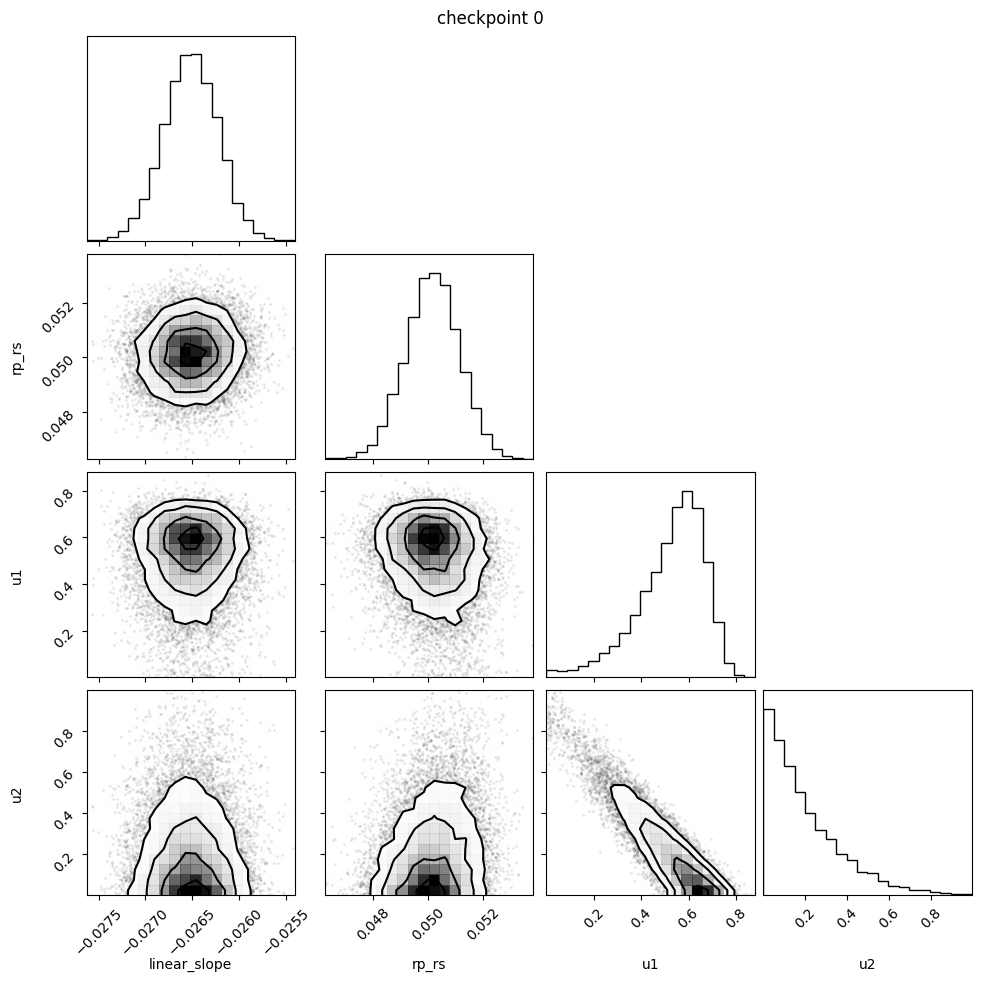


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  12141.73      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8499.90      1.00
            u1      0.53      0.14      0.55      0.31      0.74   3176.41      1.00
            u2      0.20      0.18      0.15      0.00      0.45   3049.88      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.027  0.000  -0.027   -0.026        0.000   13130.012   
rp_rs          0.050  0.001   0.048    0.052        0.000    9759.981   
u1             0.552  0.085   0.198    0.726        0.002    5470.926   
u2             0.152  0.102   0.007    0.644        0.003    5028.959   

              ess_tail  r_hat  
linear_slope    8932.0    1.0  
rp_rs           8253.0    1.0  
u1              3386.0    1.0  
u2              3340.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


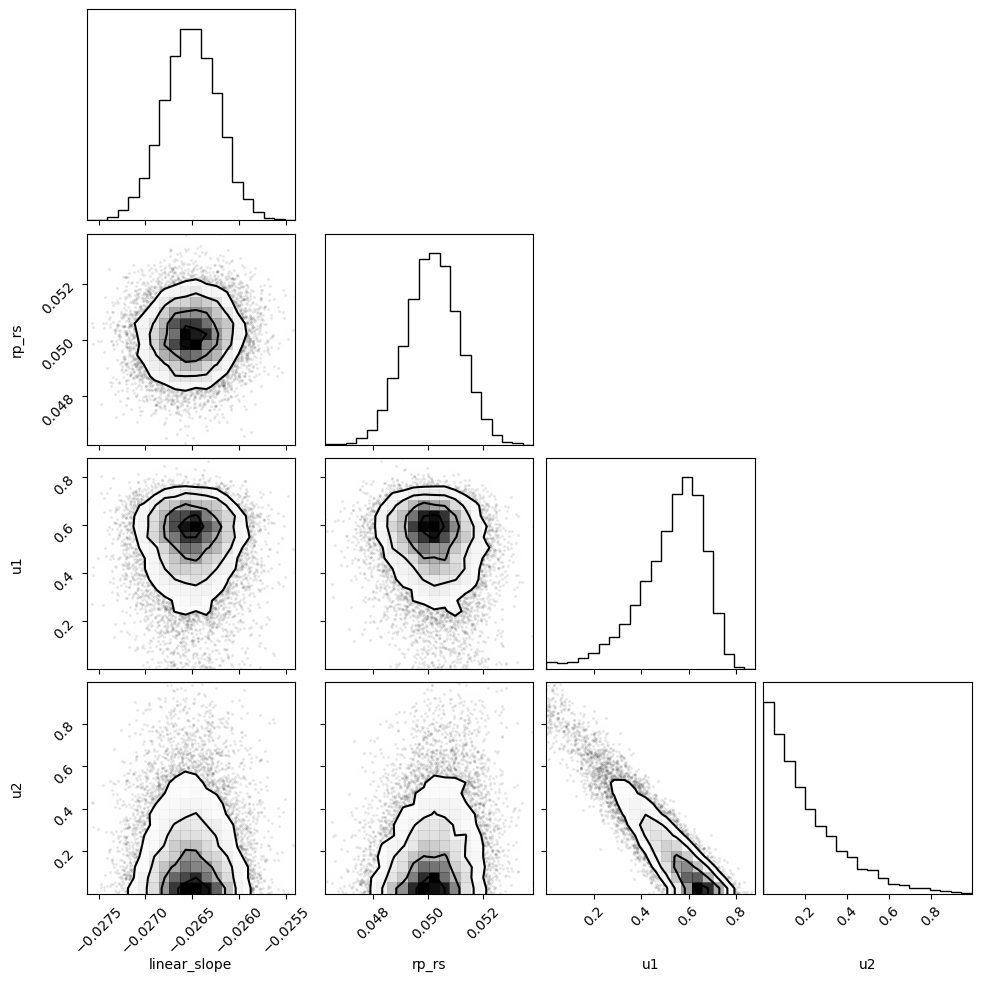

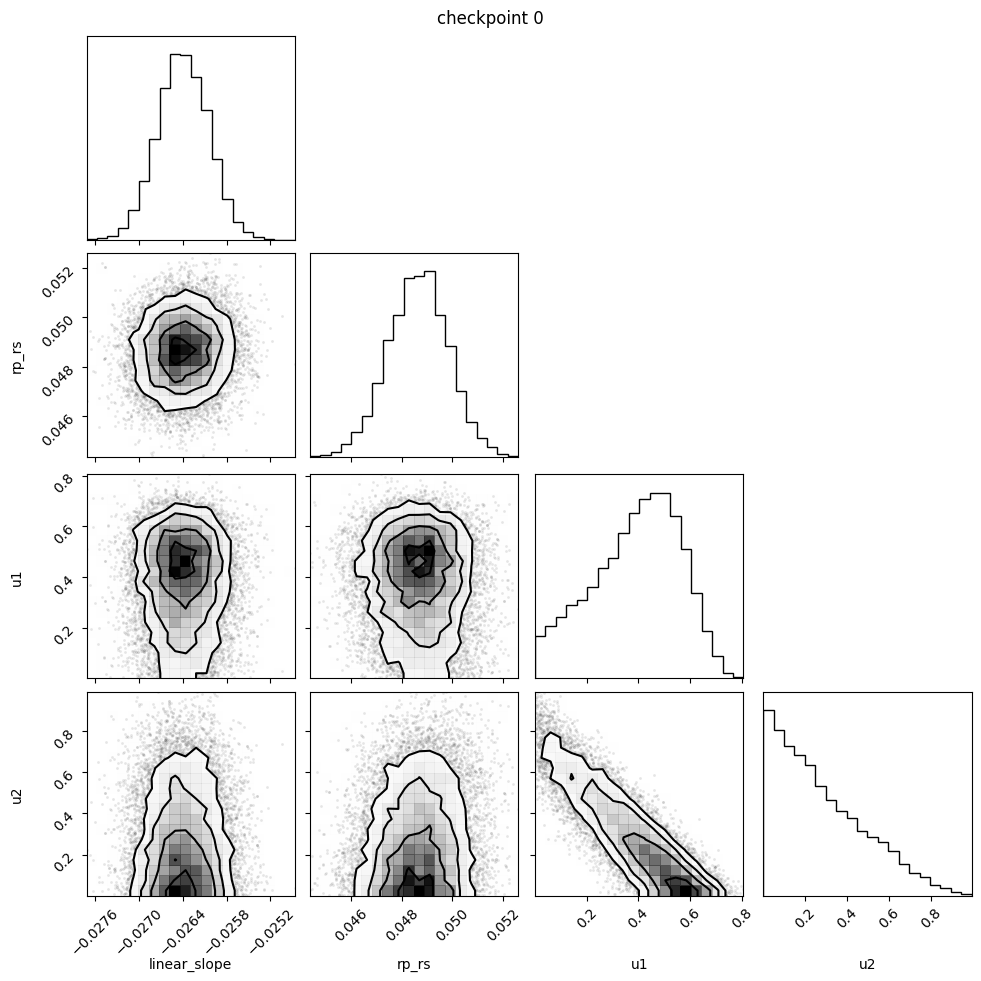


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  10453.10      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8893.31      1.00
            u1      0.39      0.17      0.41      0.10      0.65   5363.88      1.00
            u2      0.28      0.21      0.23      0.00      0.59   4960.15      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.026  0.000  -0.027   -0.026        0.000   11651.296   
rp_rs          0.049  0.001   0.046    0.051        0.000    9896.251   
u1             0.410  0.119   0.053    0.656        0.003    7041.286   
u2             0.232  0.147   0.011    0.741        0.004    6905.853   

              ess_tail  r_hat  
linear_slope    8864.0    1.0  
rp_rs           8599.0    1.0  
u1              4161.0    1.0  
u2              6117.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


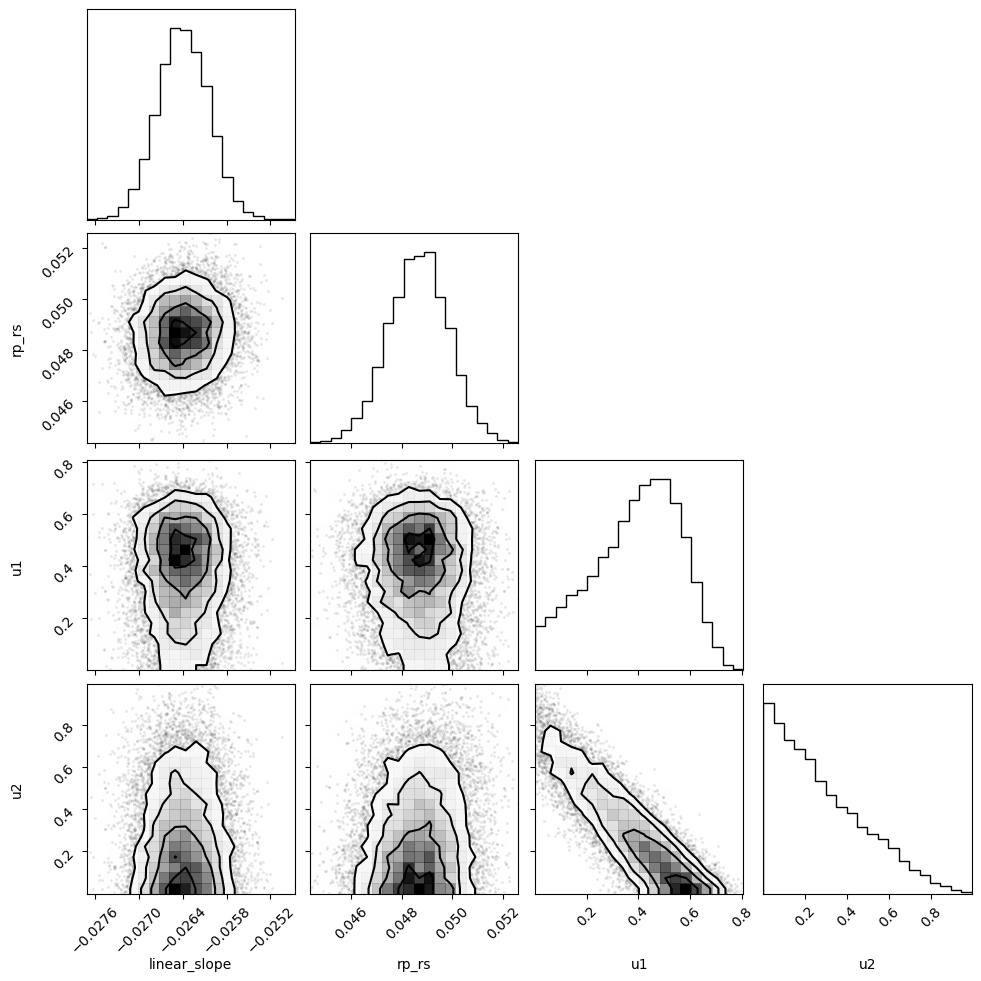

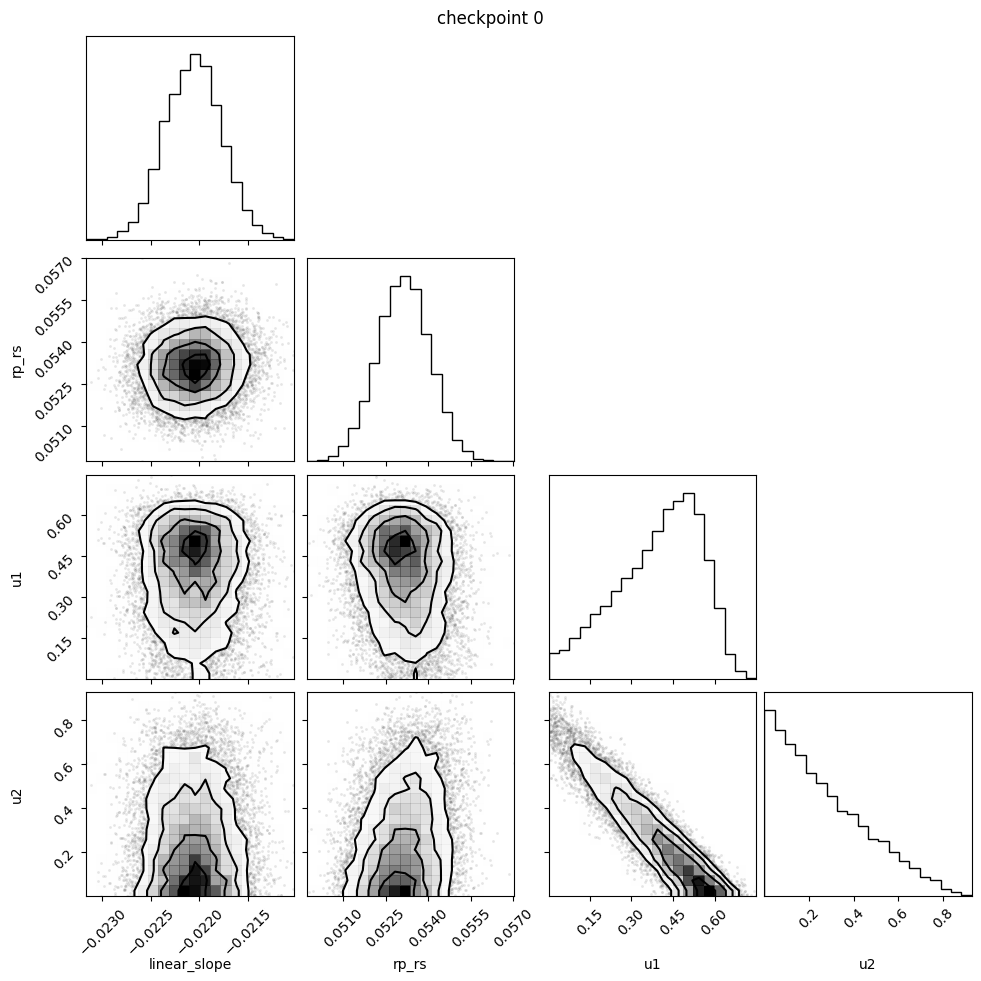


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  10586.71      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8558.86      1.00
            u1      0.40      0.15      0.42      0.13      0.62   4172.70      1.00
            u2      0.26      0.20      0.22      0.00      0.56   4037.32      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.022  0.000  -0.023   -0.022        0.000   11988.210   
rp_rs          0.053  0.001   0.051    0.055        0.000    9865.694   
u1             0.419  0.107   0.076    0.624        0.002    6318.805   
u2             0.222  0.141   0.010    0.701        0.004    6331.239   

              ess_tail  r_hat  
linear_slope    7586.0    1.0  
rp_rs           8256.0    1.0  
u1              3953.0    1.0  
u2              4536.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


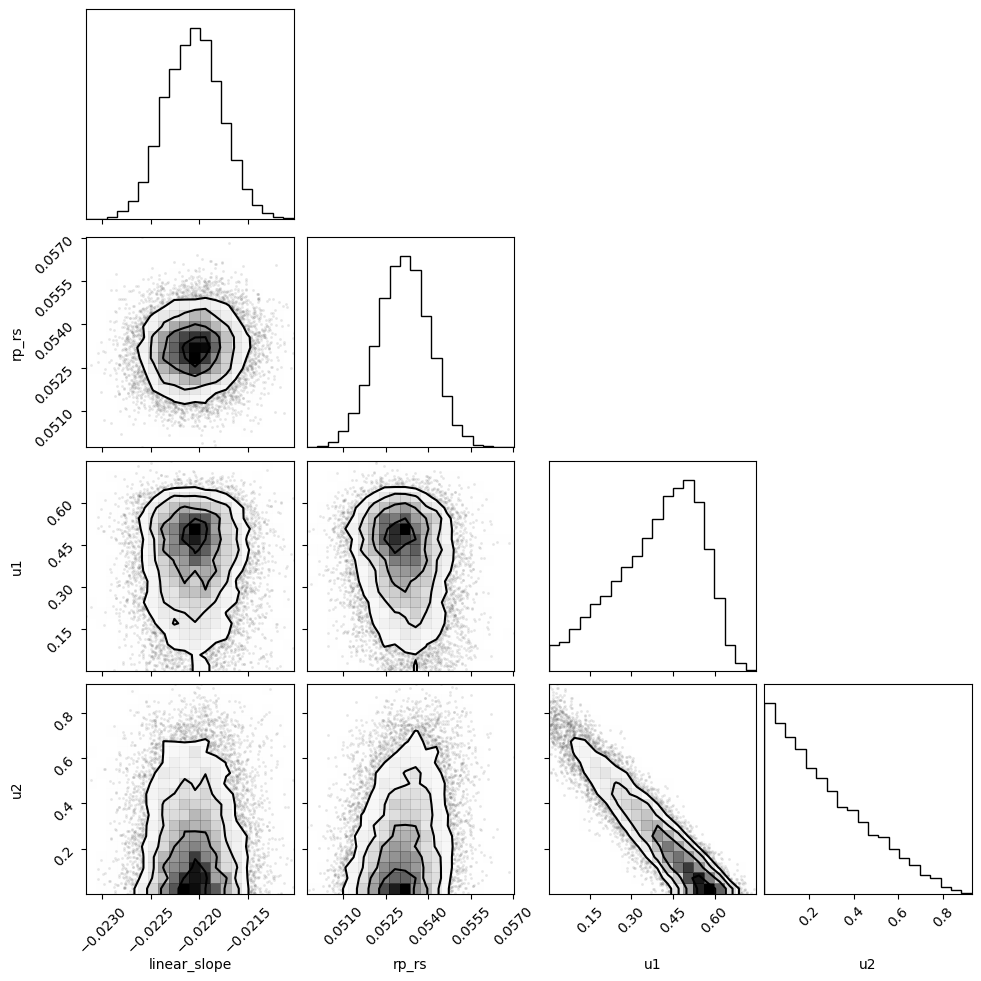

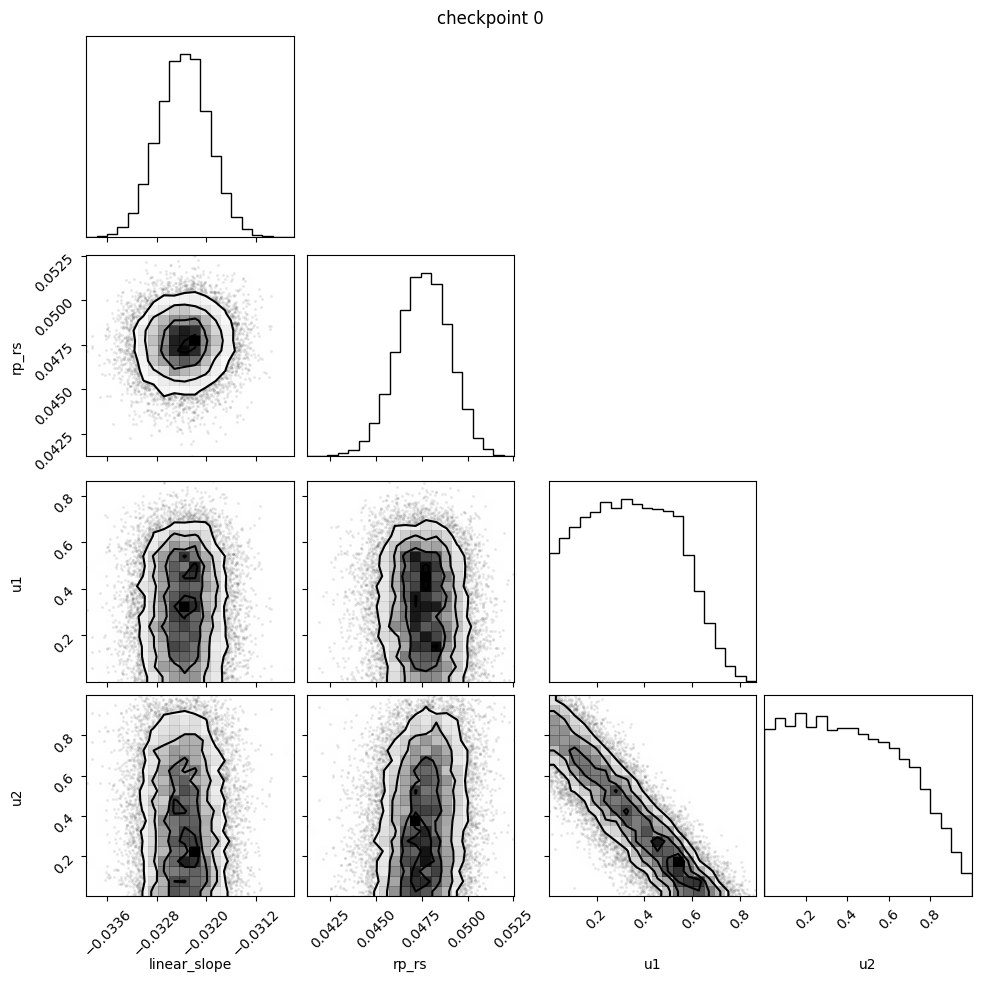


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  13009.23      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   9509.27      1.00
            u1      0.34      0.19      0.33      0.00      0.59   5062.94      1.00
            u2      0.42      0.25      0.40      0.01      0.78   5126.75      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.032  0.000  -0.033   -0.032        0.000   13844.359   
rp_rs          0.048  0.001   0.045    0.050        0.000    9851.695   
u1             0.333  0.153   0.026    0.675        0.005    5938.562   
u2             0.401  0.208   0.026    0.888        0.006    6016.099   

              ess_tail  r_hat  
linear_slope    9234.0    1.0  
rp_rs           8905.0    1.0  
u1              5552.0    1.0  
u2              6714.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


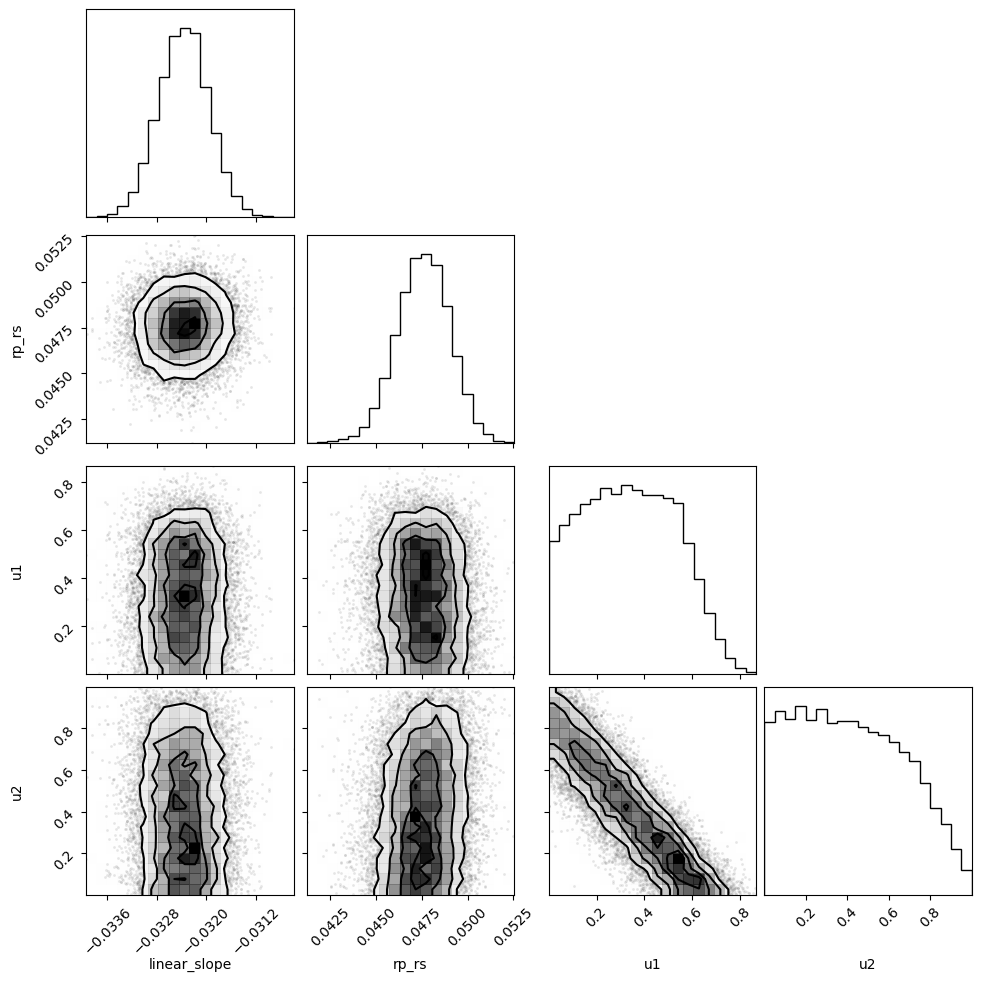

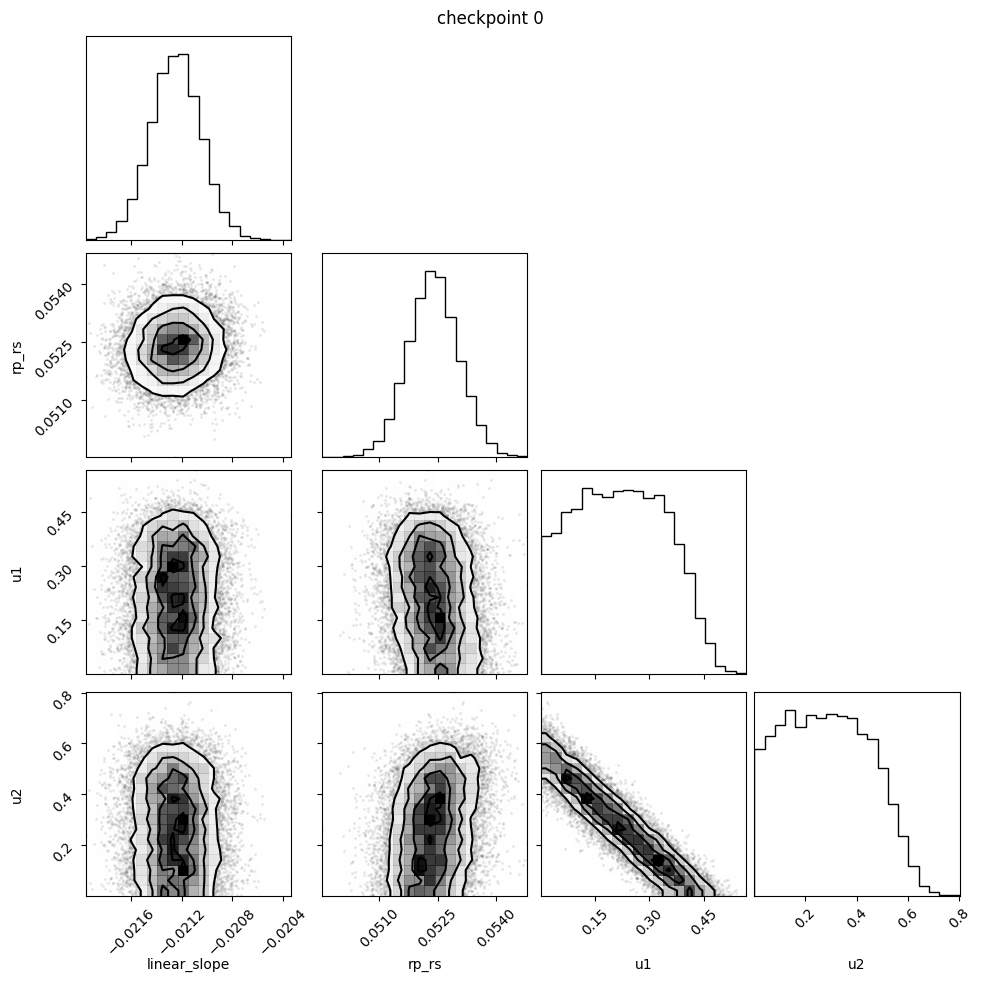


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12125.26      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6995.93      1.00
            u1      0.22      0.12      0.22      0.00      0.38   3491.89      1.00
            u2      0.28      0.16      0.28      0.00      0.51   3434.39      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.021  0.000  -0.022   -0.021        0.000   13222.385   
rp_rs          0.052  0.000   0.051    0.054        0.000    8147.536   
u1             0.217  0.100   0.014    0.433        0.003    4459.160   
u2             0.280  0.134   0.021    0.579        0.004    4397.054   

              ess_tail  r_hat  
linear_slope    8643.0    1.0  
rp_rs           7396.0    1.0  
u1              3159.0    1.0  
u2              4194.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


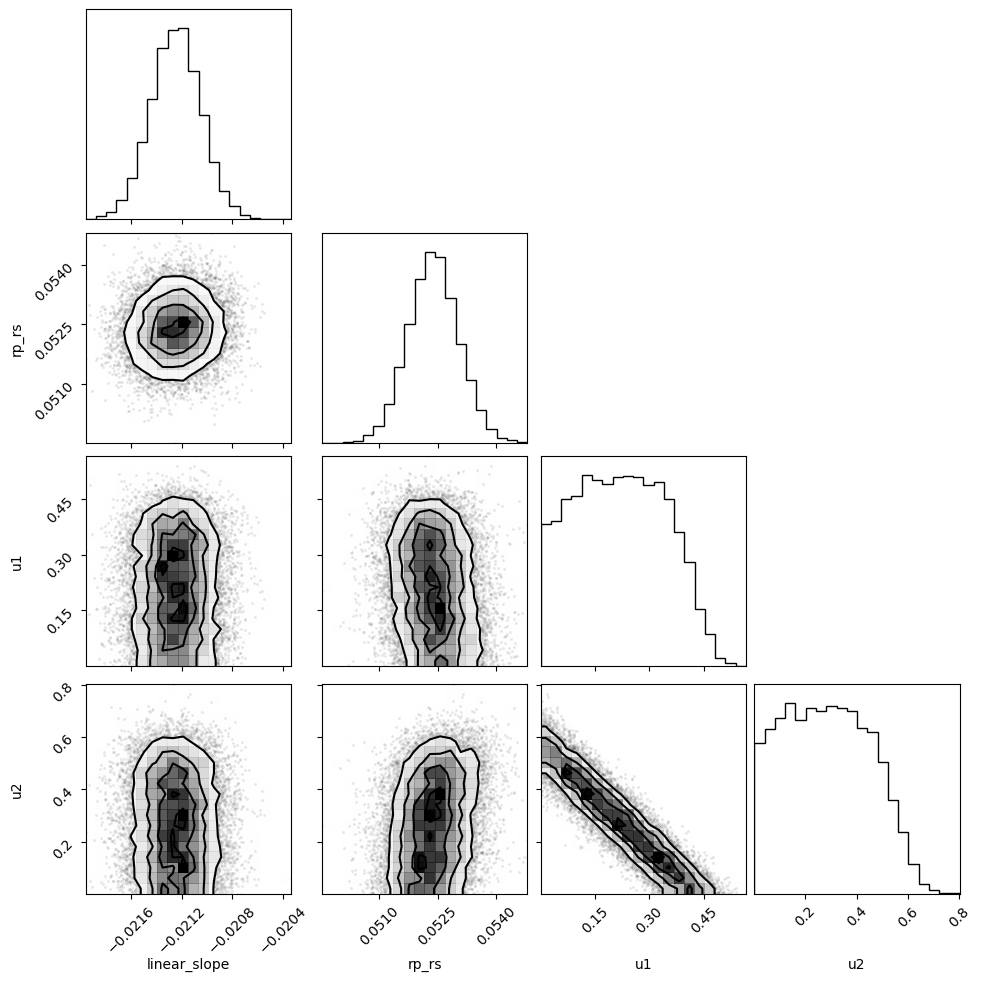

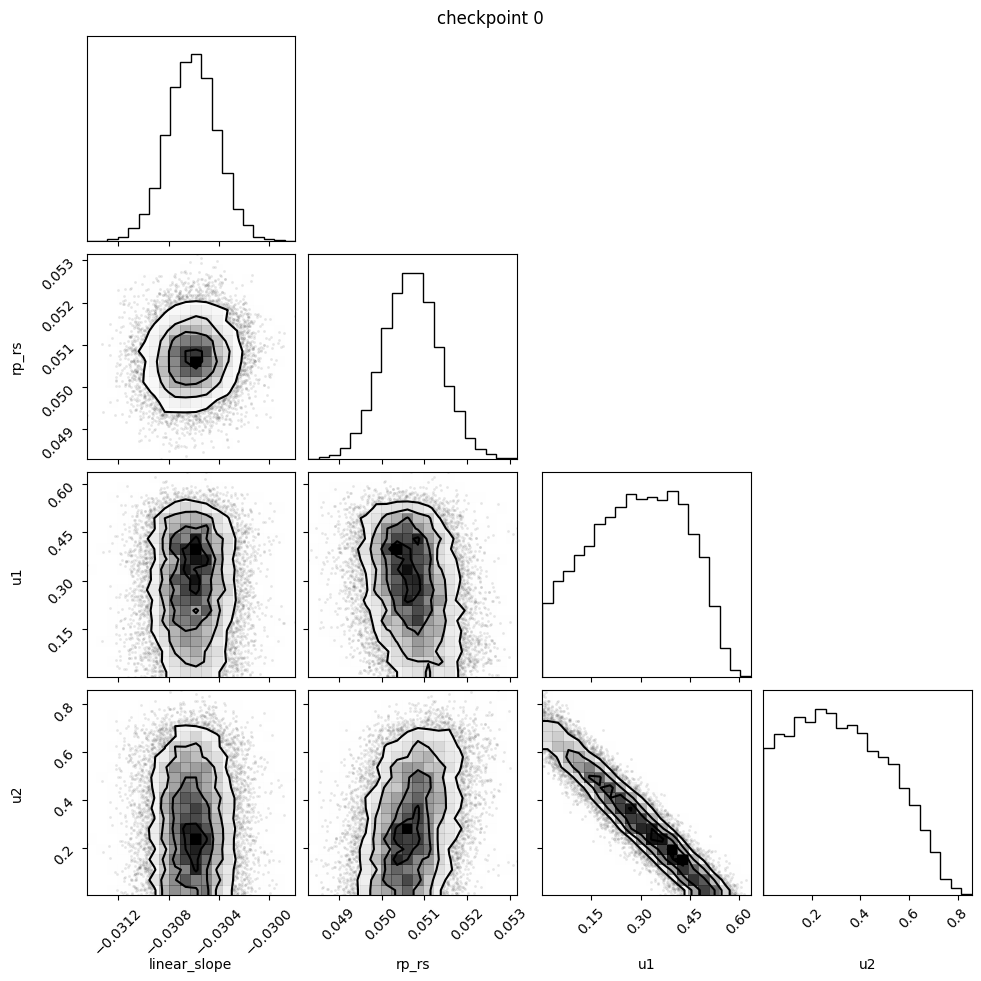


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  13192.68      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7468.36      1.00
            u1      0.29      0.14      0.29      0.05      0.51   3358.61      1.00
            u2      0.32      0.19      0.31      0.00      0.59   3398.51      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.031  0.000  -0.031   -0.030        0.000   14041.587   
rp_rs          0.051  0.000   0.049    0.052        0.000    8254.143   
u1             0.293  0.112   0.032    0.523        0.003    4241.395   
u2             0.308  0.152   0.023    0.681        0.005    4454.750   

              ess_tail  r_hat  
linear_slope    9141.0    1.0  
rp_rs           7441.0    1.0  
u1              4224.0    1.0  
u2              4777.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


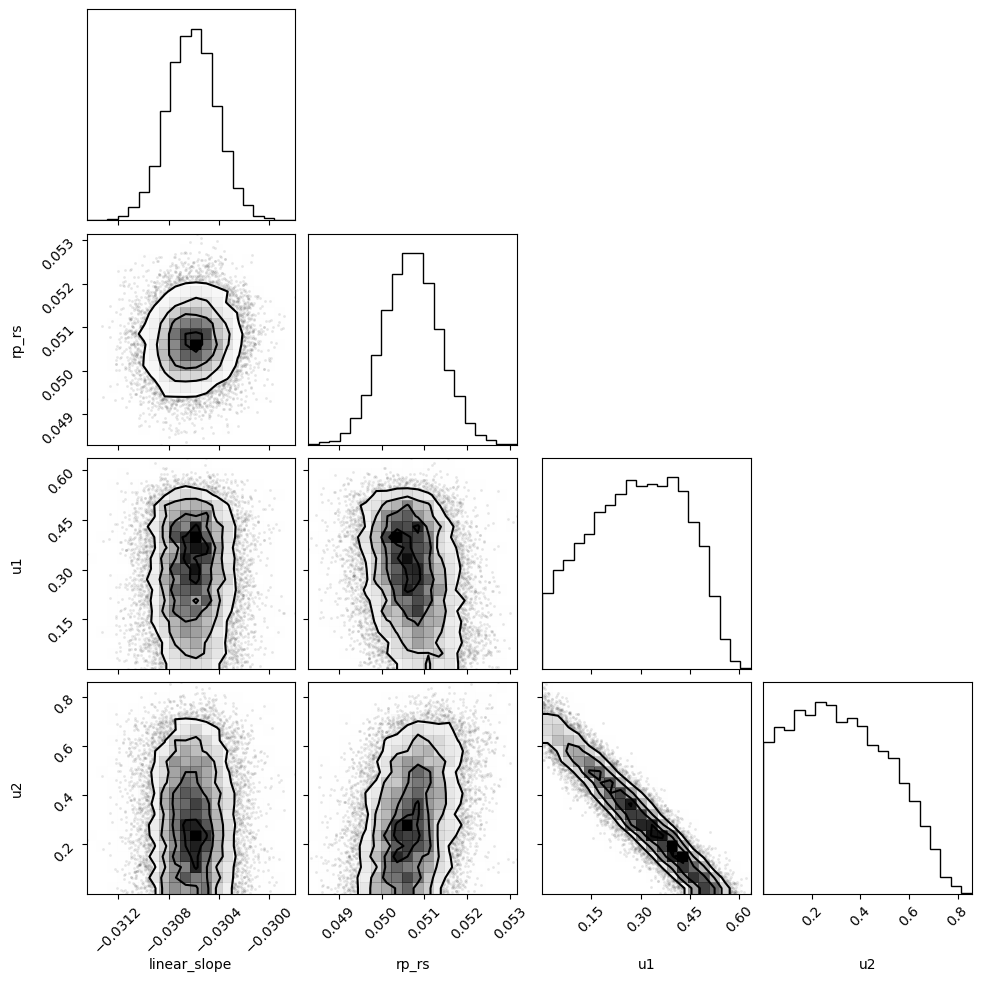

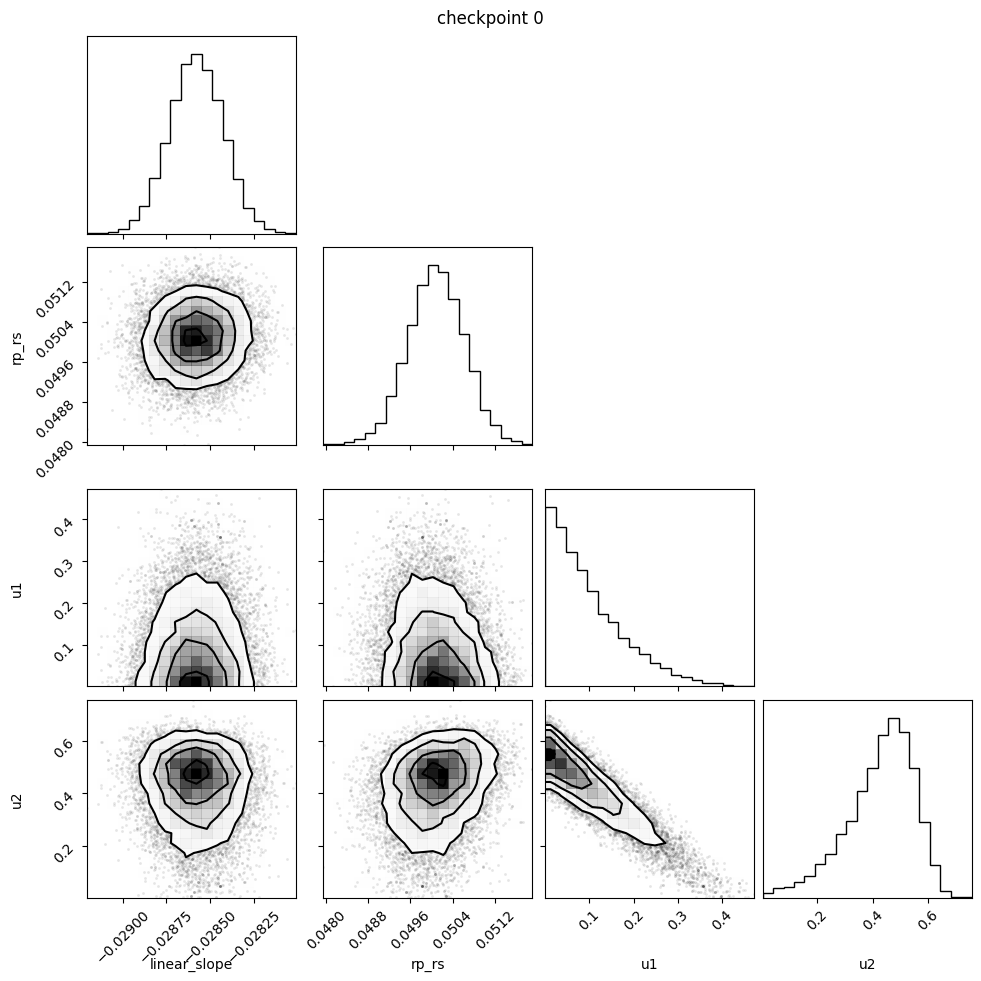


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  14462.37      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6955.63      1.00
            u1      0.10      0.08      0.08      0.00      0.22   3414.38      1.00
            u2      0.43      0.12      0.45      0.23      0.61   3599.04      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.029  0.000  -0.029   -0.028        0.000   14234.172   
rp_rs          0.050  0.000   0.049    0.051        0.000    8159.923   
u1             0.079  0.051   0.003    0.297        0.001    5117.942   
u2             0.445  0.077   0.148    0.607        0.002    5716.429   

              ess_tail  r_hat  
linear_slope    8407.0    1.0  
rp_rs           7645.0    1.0  
u1              3400.0    1.0  
u2              3050.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


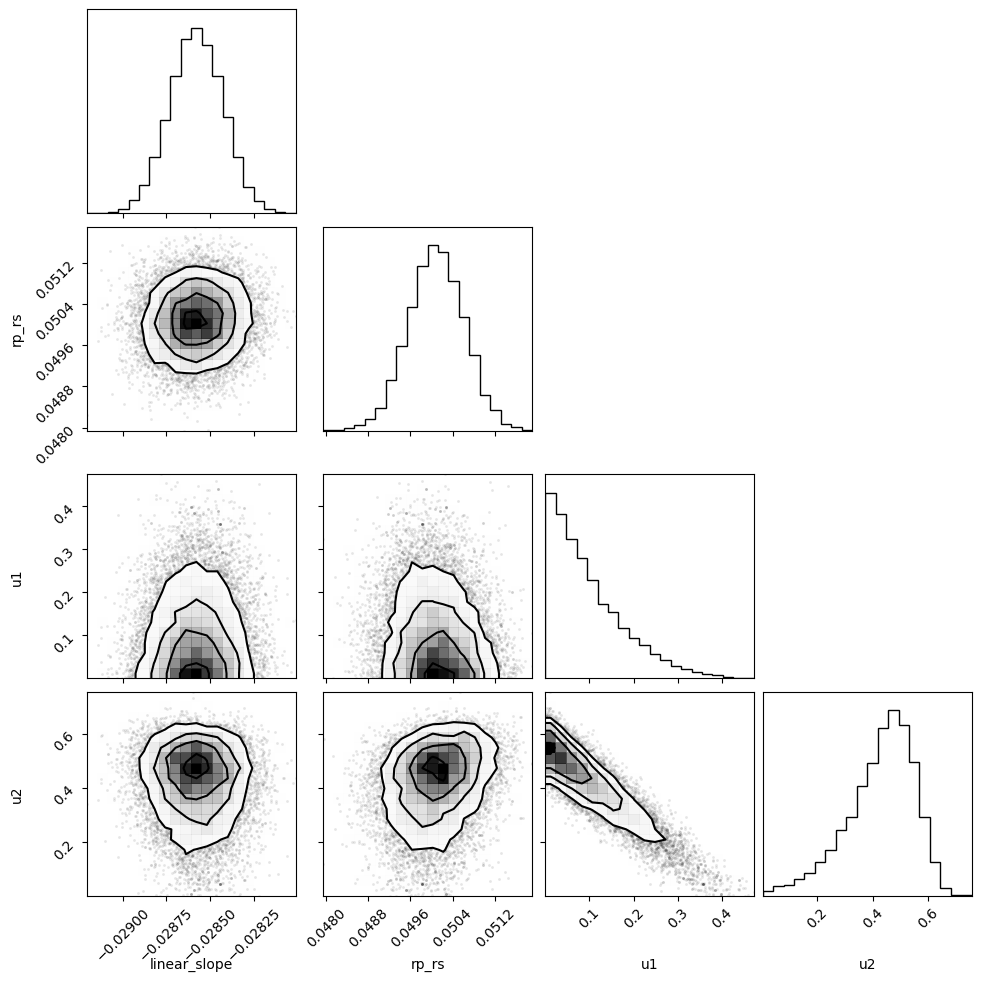

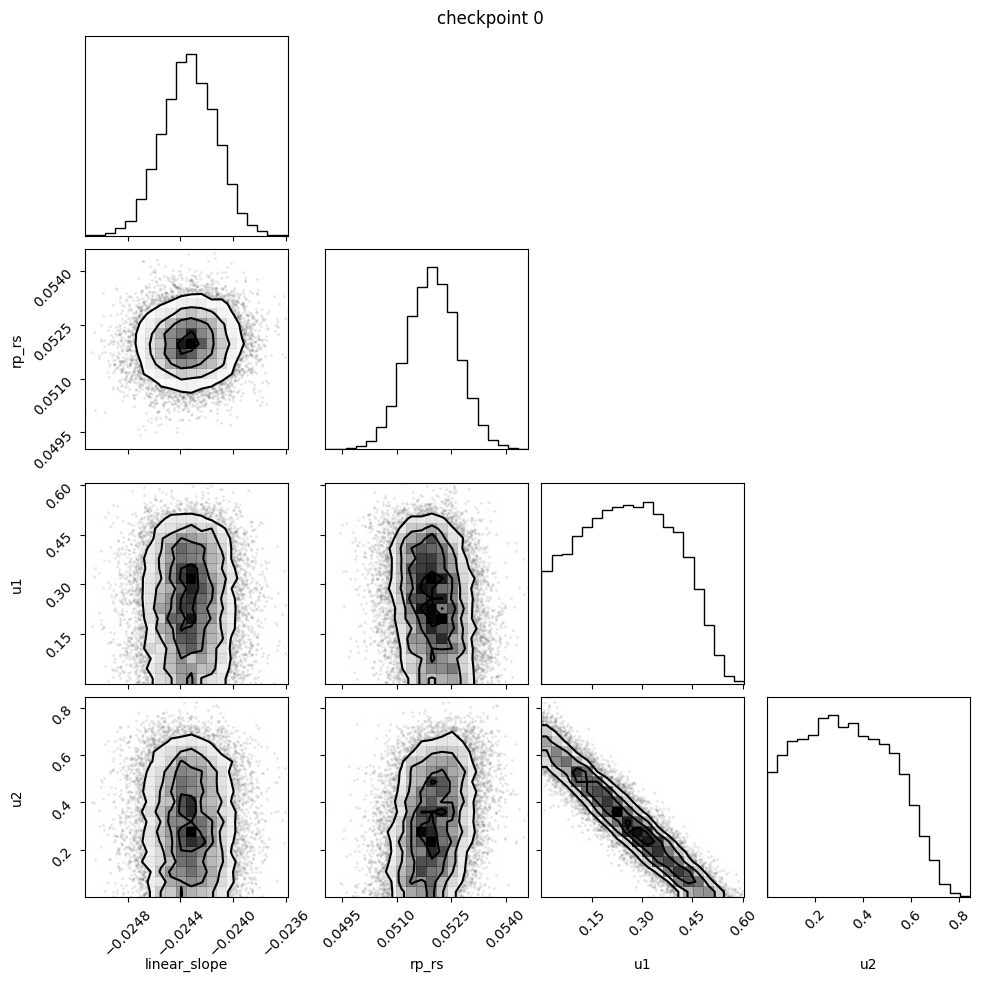


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12033.56      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7026.00      1.00
            u1      0.25      0.14      0.25      0.02      0.46   3742.38      1.00
            u2      0.33      0.18      0.32      0.01      0.59   3723.74      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.024  0.000  -0.025   -0.024        0.000   12384.092   
rp_rs          0.052  0.000   0.051    0.053        0.000    8419.102   
u1             0.254  0.110   0.021    0.491        0.003    4653.176   
u2             0.318  0.149   0.026    0.661        0.005    4725.504   

              ess_tail  r_hat  
linear_slope    9696.0    1.0  
rp_rs           7911.0    1.0  
u1              3772.0    1.0  
u2              2569.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


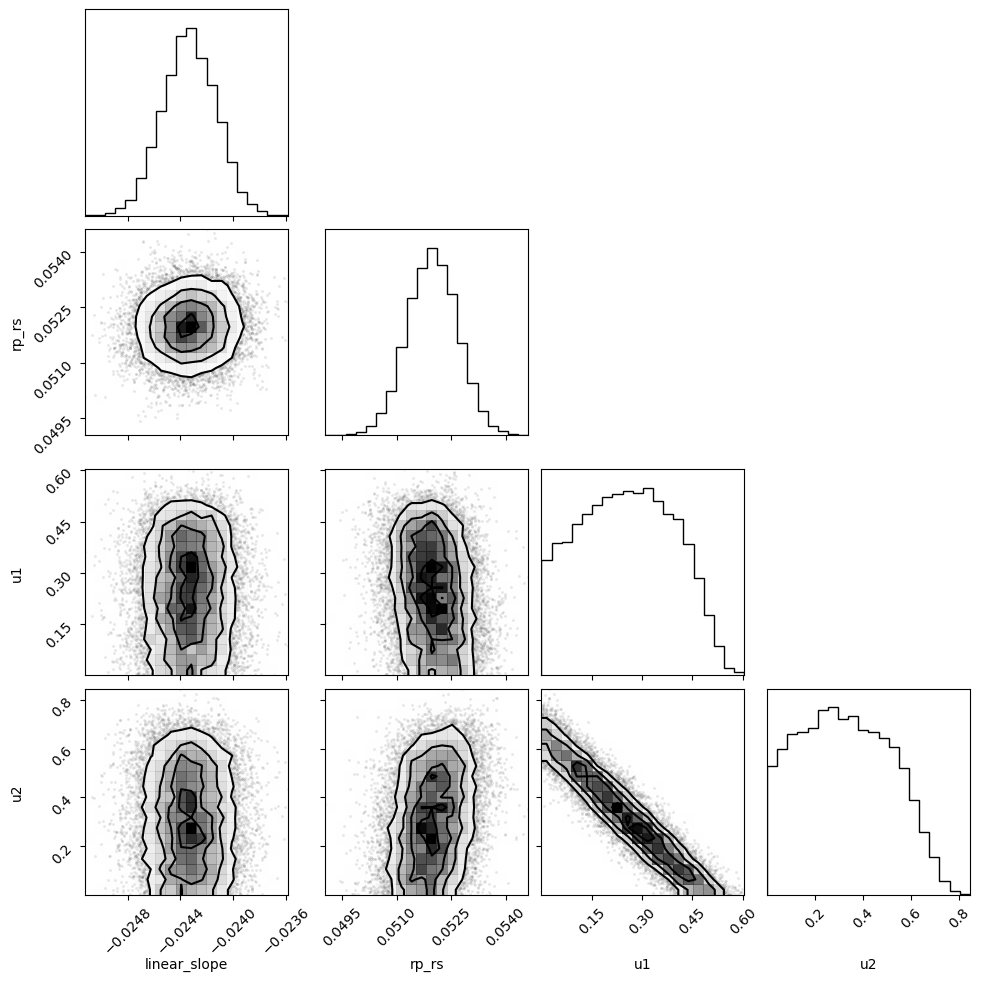

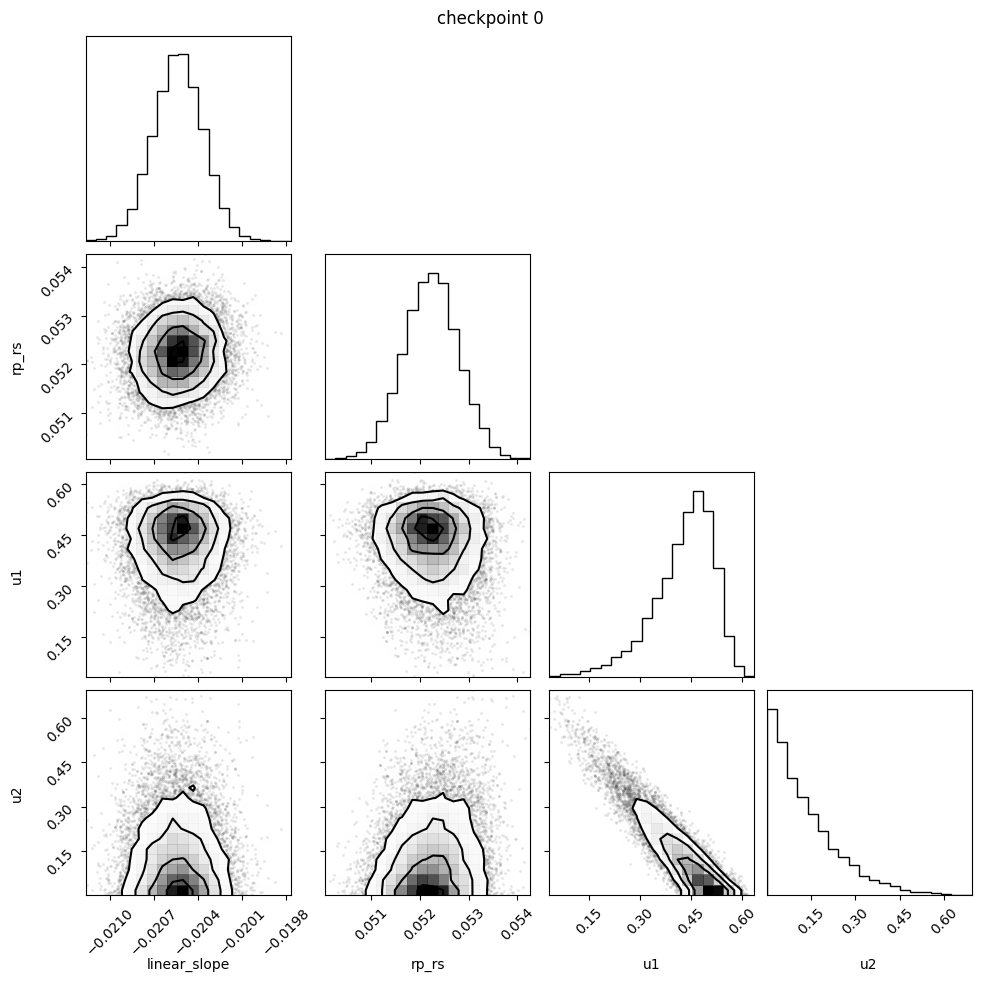


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12703.39      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8089.26      1.00
            u1      0.43      0.09      0.44      0.29      0.57   2709.42      1.00
            u2      0.13      0.11      0.10      0.00      0.29   2681.90      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.021  0.000  -0.021   -0.020        0.000   13682.937   
rp_rs          0.052  0.000   0.051    0.053        0.000    9032.245   
u1             0.443  0.055   0.215    0.554        0.001    4574.320   
u2             0.100  0.067   0.005    0.412        0.002    4391.983   

              ess_tail  r_hat  
linear_slope    8725.0    1.0  
rp_rs           8287.0    1.0  
u1              2582.0    1.0  
u2              2938.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


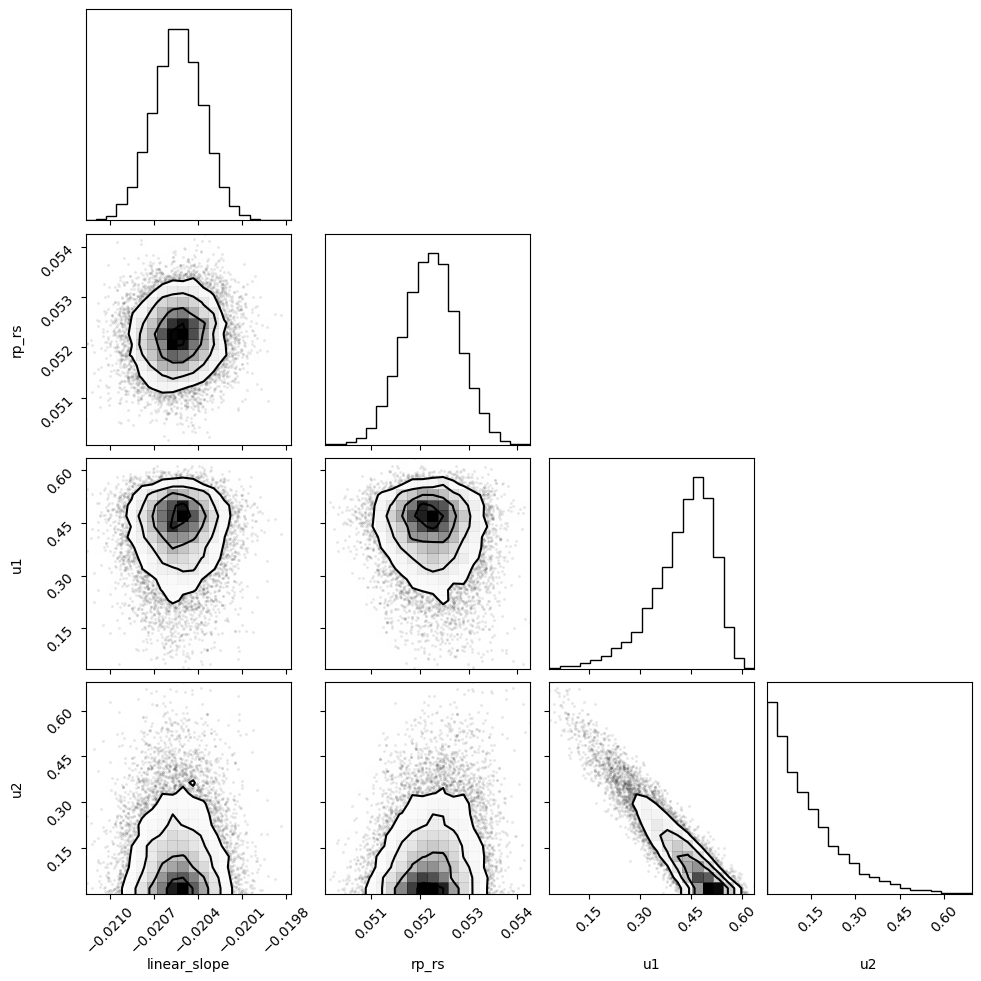

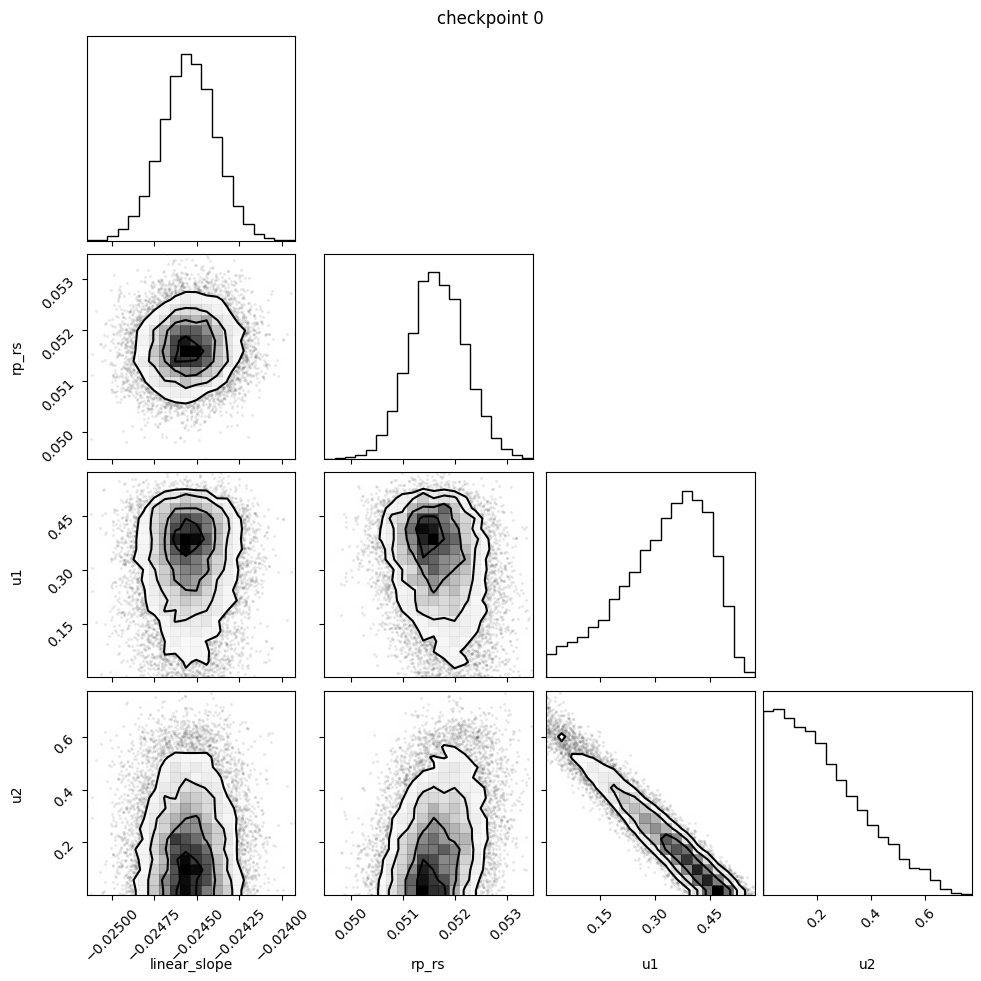


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12109.47      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6407.81      1.00
            u1      0.32      0.12      0.34      0.13      0.51   2539.66      1.00
            u2      0.22      0.16      0.19      0.00      0.46   2472.09      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.025  0.000  -0.025   -0.024        0.000   13433.019   
rp_rs          0.052  0.000   0.051    0.053        0.000    7669.266   
u1             0.342  0.083   0.059    0.500        0.003    4083.162   
u2             0.194  0.112   0.011    0.578        0.003    4053.716   

              ess_tail  r_hat  
linear_slope    8617.0    1.0  
rp_rs           7029.0    1.0  
u1              1906.0    1.0  
u2              2181.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


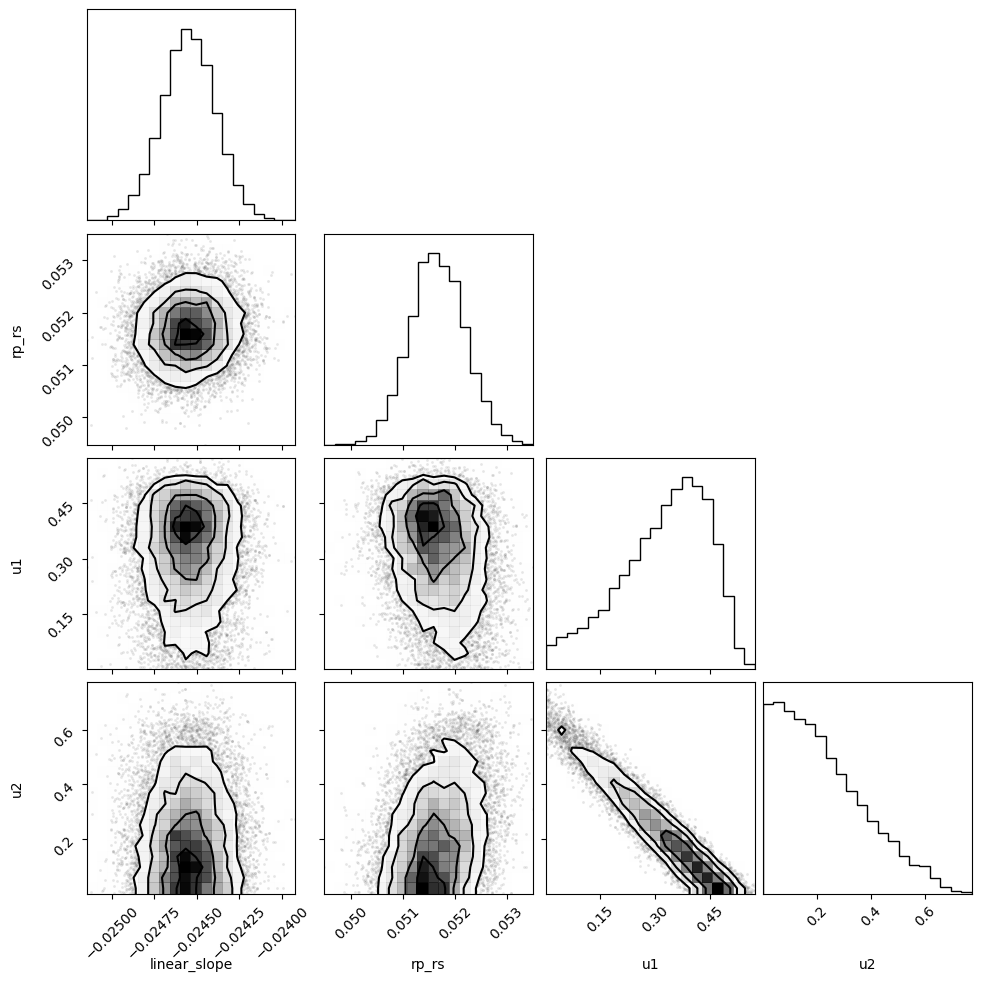

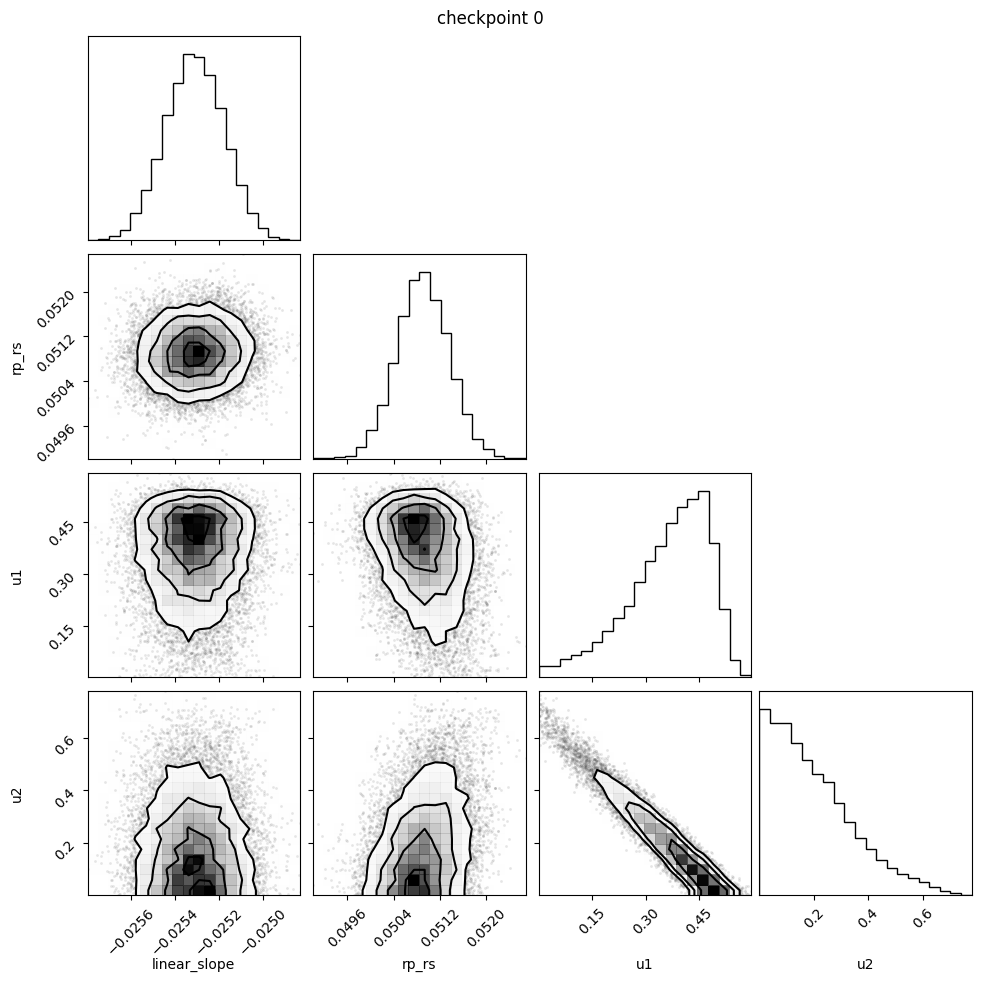


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.03      0.00     -0.03     -0.03     -0.03  14136.90      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6840.87      1.00
            u1      0.36      0.11      0.38      0.19      0.53   2463.09      1.00
            u2      0.20      0.15      0.17      0.00      0.42   2441.87      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.025  0.000  -0.026   -0.025        0.000   14589.334   
rp_rs          0.051  0.000   0.050    0.052        0.000    7804.645   
u1             0.383  0.074   0.100    0.519        0.002    3951.898   
u2             0.169  0.100   0.009    0.554        0.003    3948.240   

              ess_tail  r_hat  
linear_slope    9572.0    1.0  
rp_rs           7707.0    1.0  
u1              1870.0    1.0  
u2              2021.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


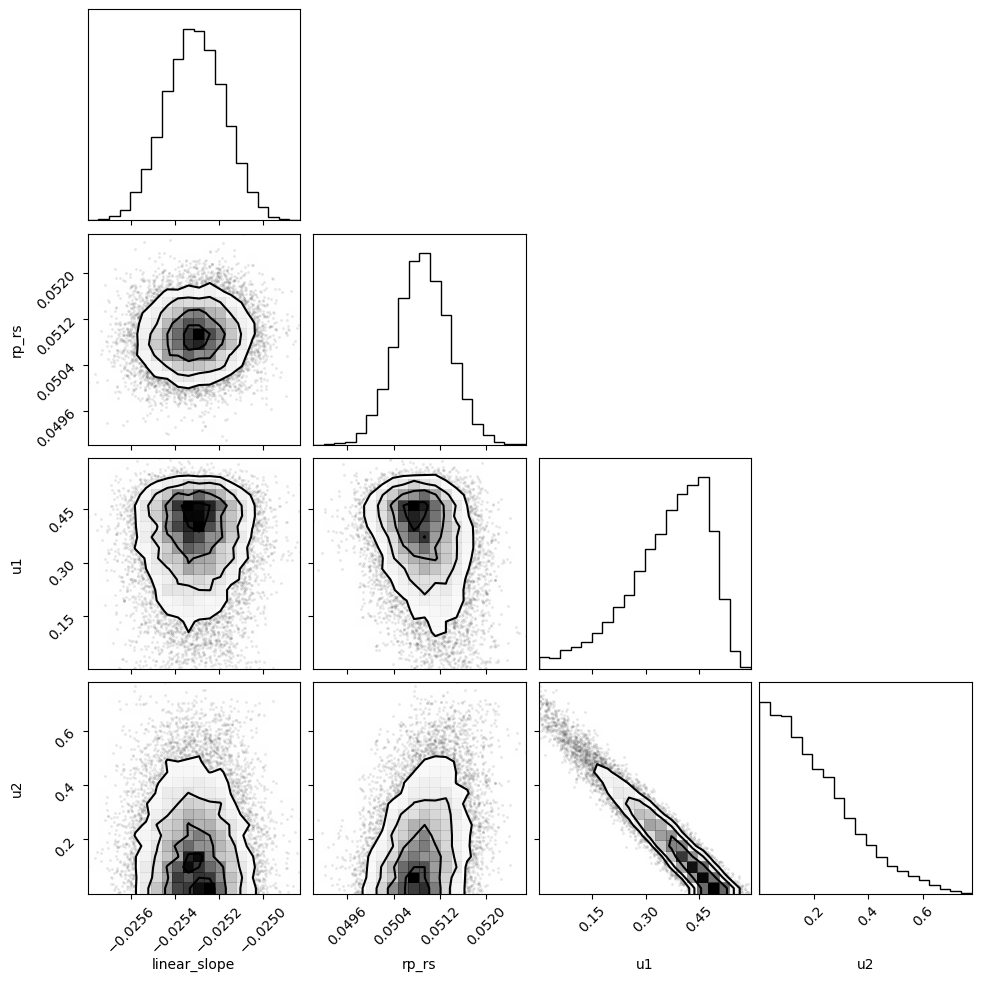

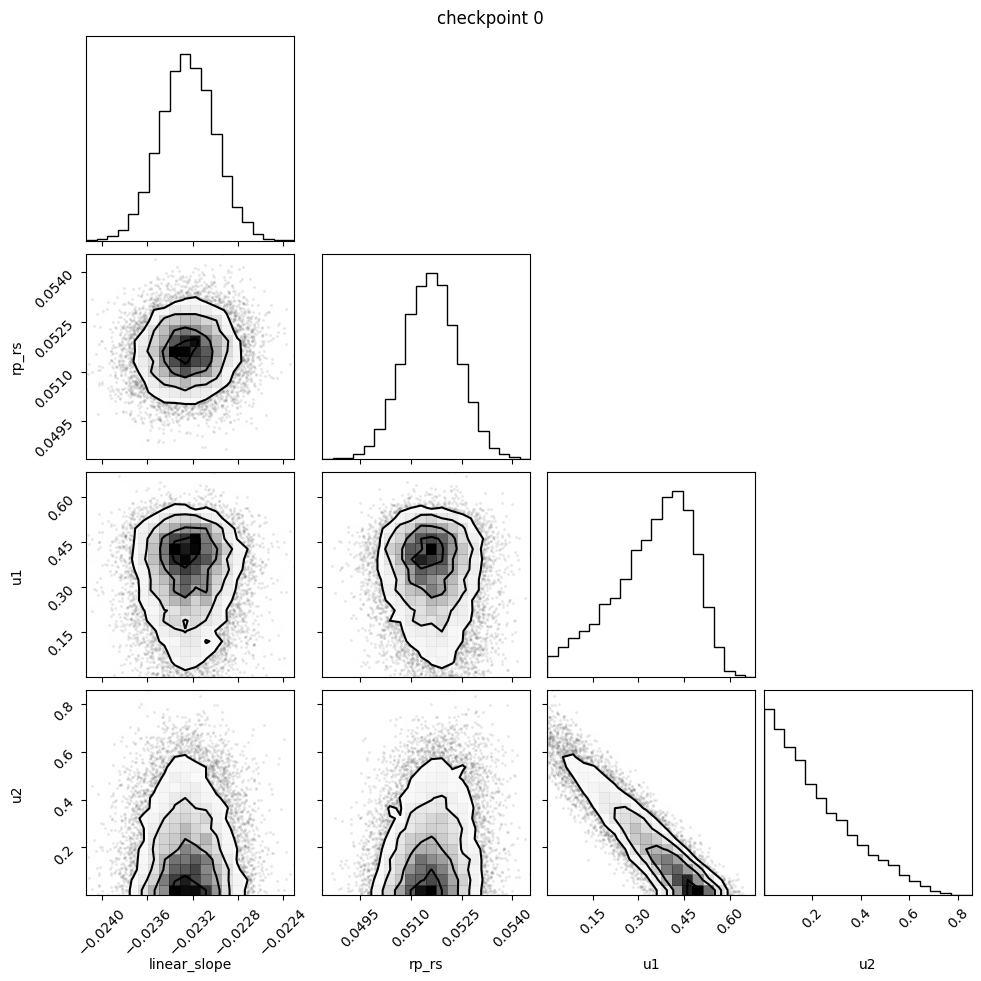


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  11684.71      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8167.49      1.00
            u1      0.35      0.13      0.37      0.13      0.54   3622.01      1.00
            u2      0.21      0.16      0.17      0.00      0.46   3582.19      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.023  0.000  -0.024   -0.023        0.000   12969.997   
rp_rs          0.052  0.001   0.050    0.053        0.000    9722.992   
u1             0.366  0.087   0.065    0.541        0.002    5667.556   
u2             0.171  0.110   0.008    0.579        0.003    5562.678   

              ess_tail  r_hat  
linear_slope    8566.0    1.0  
rp_rs           8257.0    1.0  
u1              3304.0    1.0  
u2              4126.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


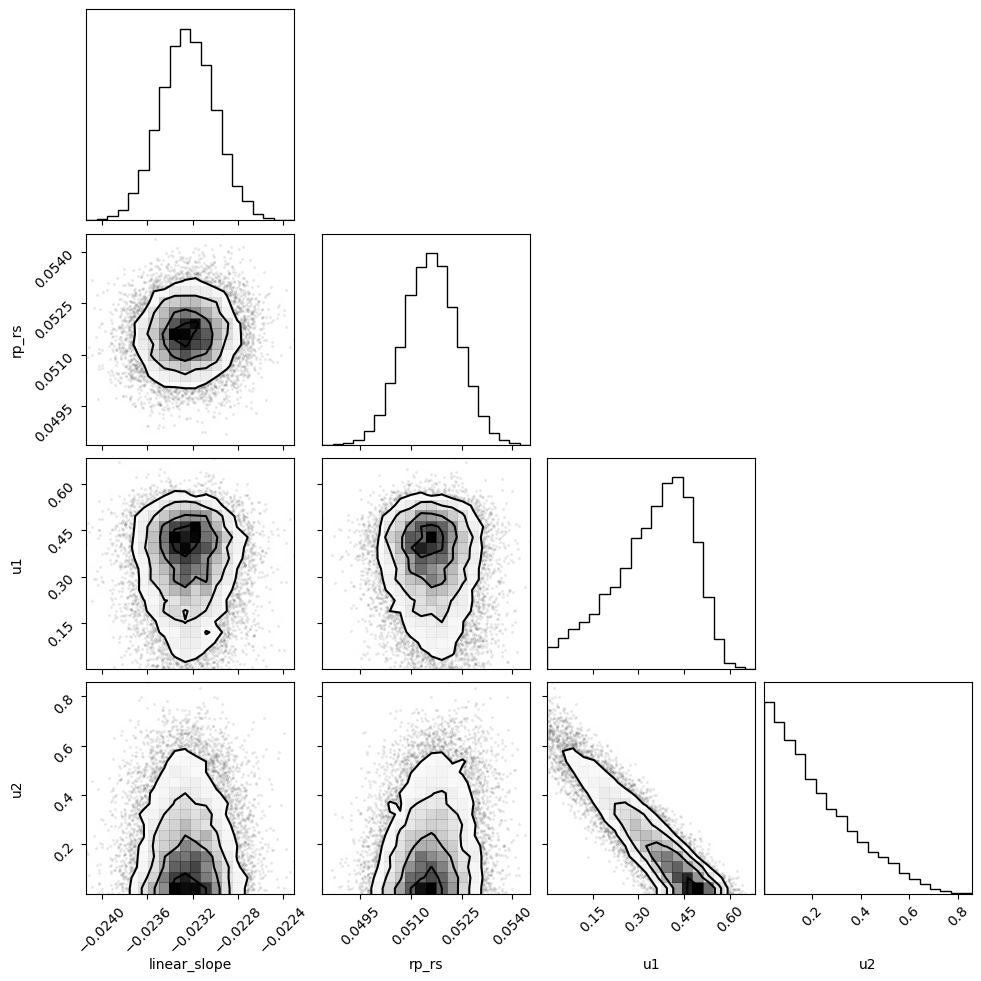

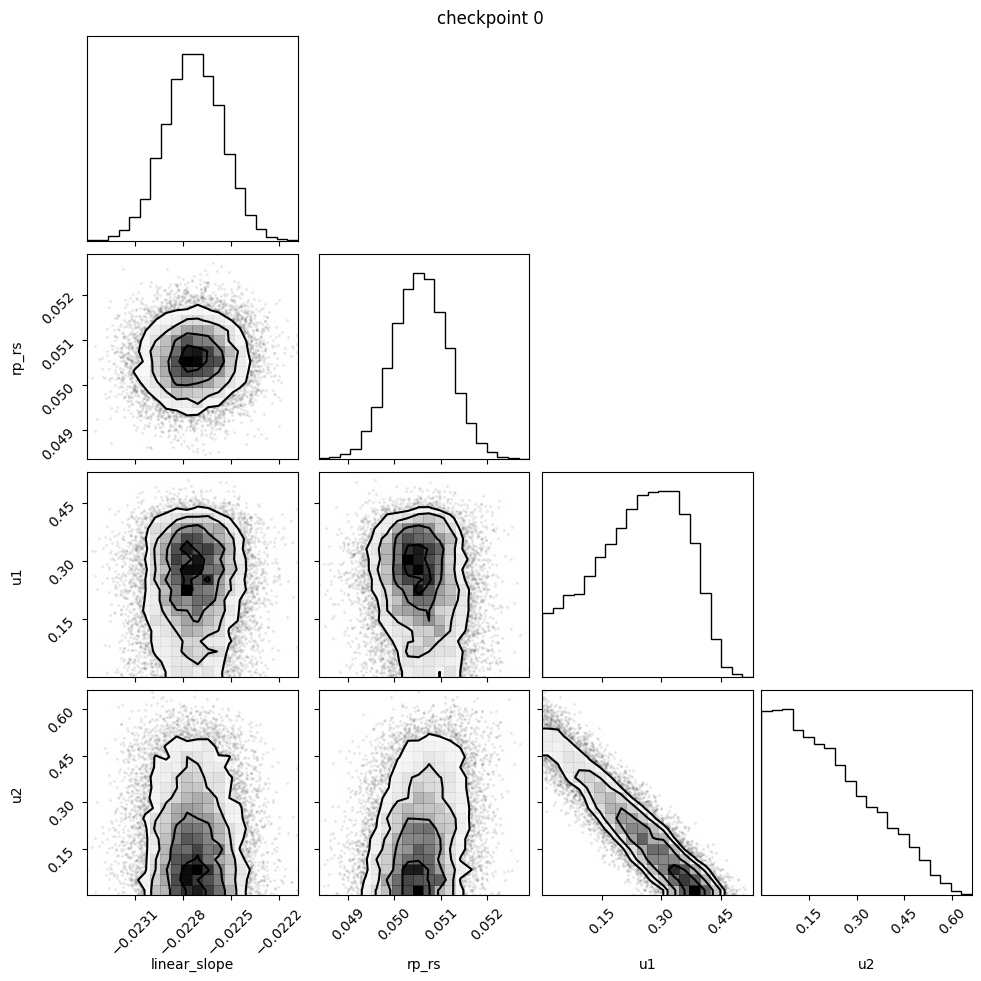


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  14439.79      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7317.84      1.00
            u1      0.24      0.11      0.25      0.06      0.42   3822.15      1.00
            u2      0.21      0.14      0.19      0.00      0.42   3671.28      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.023  0.000  -0.023   -0.022        0.000   14693.769   
rp_rs          0.051  0.000   0.049    0.052        0.000    8515.060   
u1             0.254  0.083   0.027    0.420        0.002    5220.810   
u2             0.186  0.108   0.011    0.509        0.003    5301.633   

              ess_tail  r_hat  
linear_slope    9079.0    1.0  
rp_rs           7738.0    1.0  
u1              3036.0    1.0  
u2              4302.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


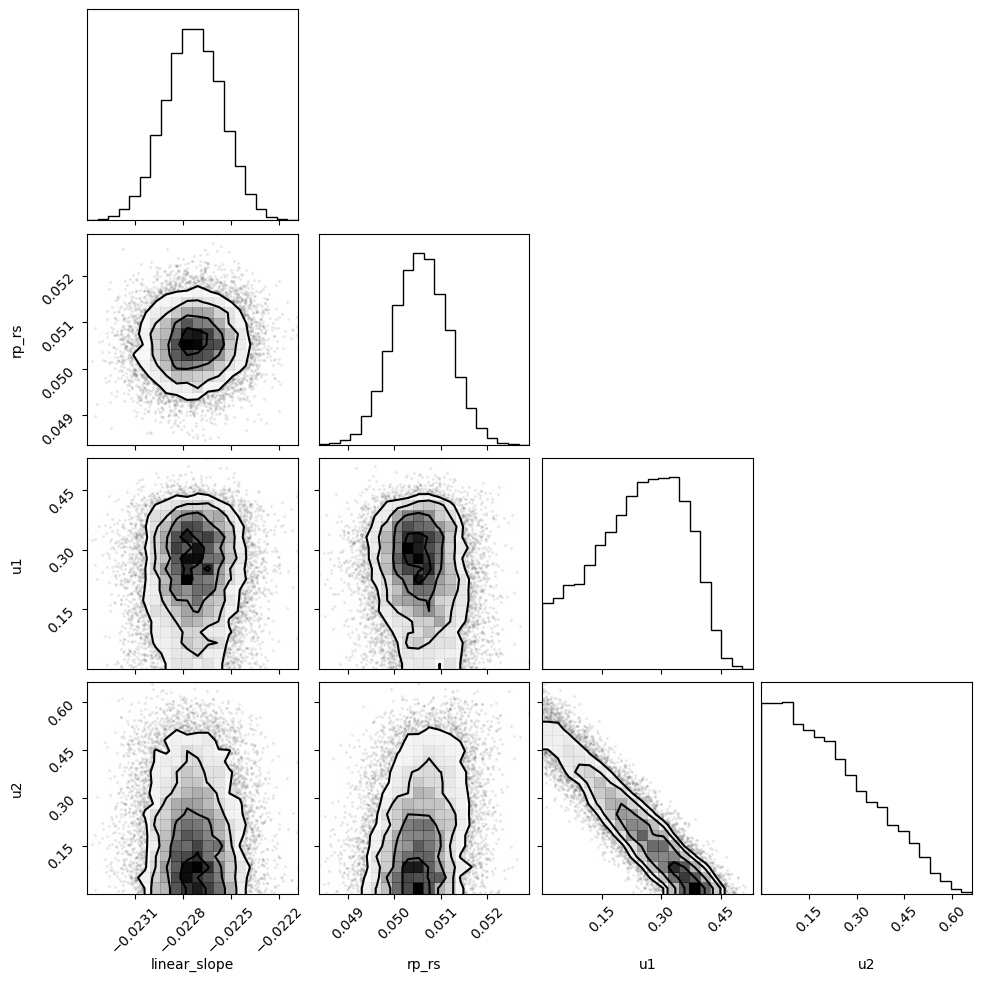

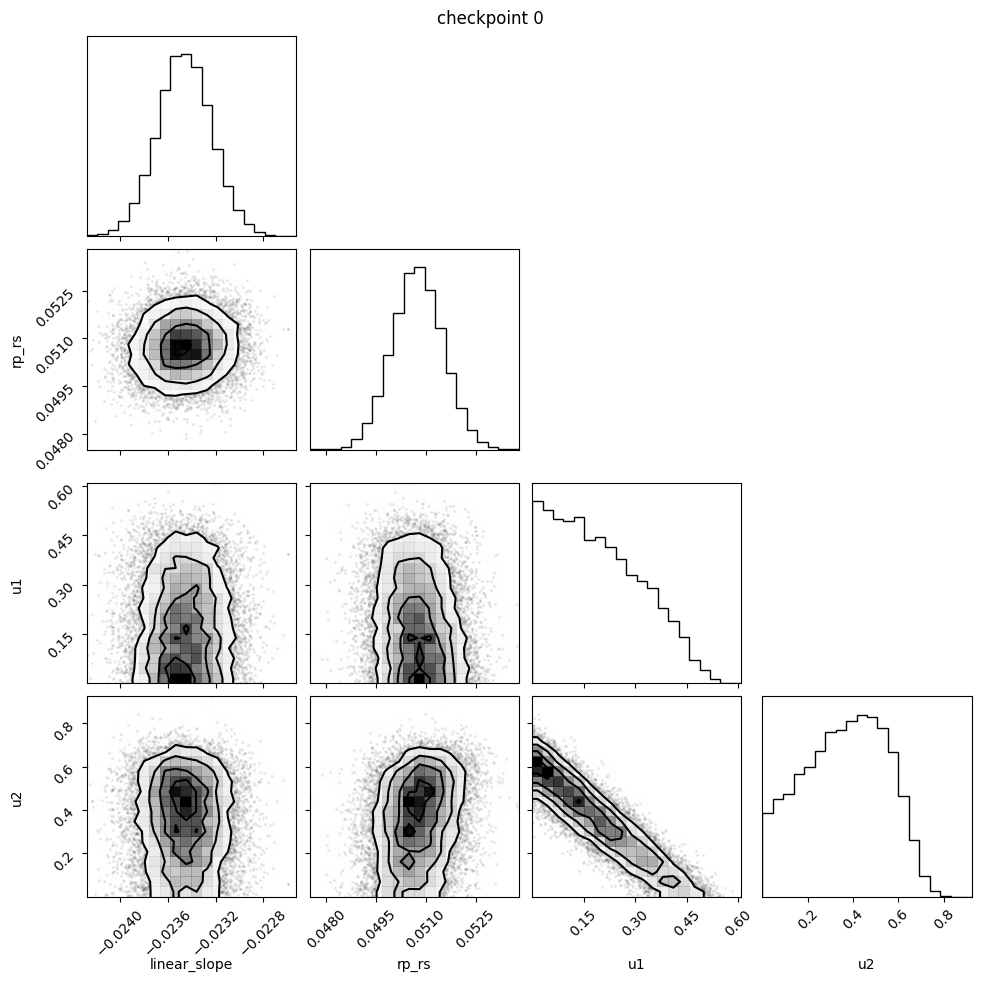


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12496.47      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7373.55      1.00
            u1      0.19      0.13      0.18      0.00      0.38   3226.05      1.00
            u2      0.36      0.18      0.37      0.04      0.62   3361.53      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.023  0.000  -0.024   -0.023        0.000   12866.094   
rp_rs          0.051  0.001   0.049    0.052        0.000    9539.207   
u1             0.177  0.100   0.008    0.444        0.003    4260.604   
u2             0.373  0.140   0.036    0.661        0.004    4587.252   

              ess_tail  r_hat  
linear_slope    9187.0    1.0  
rp_rs           8251.0    1.0  
u1              2968.0    1.0  
u2              3019.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


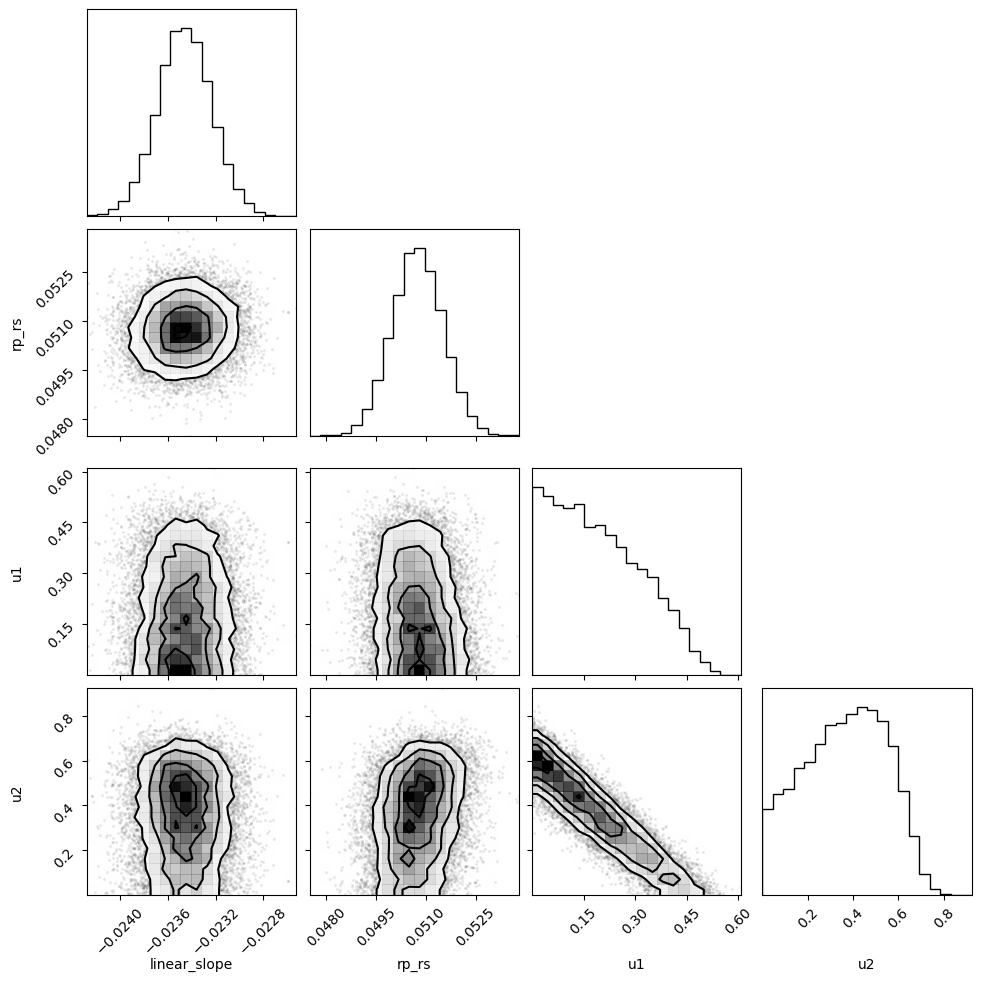

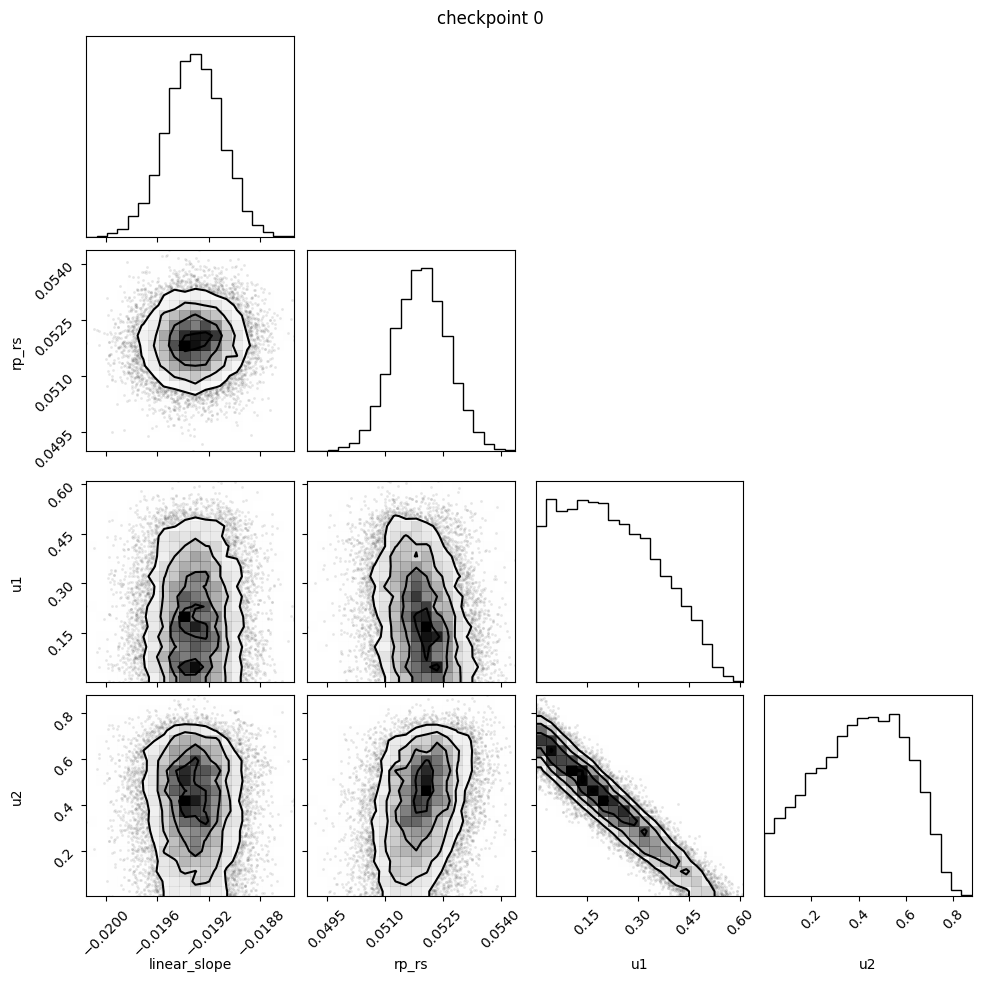


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  10147.54      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7871.82      1.00
            u1      0.22      0.14      0.21      0.00      0.42   4173.24      1.00
            u2      0.40      0.19      0.41      0.08      0.70   4278.45      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.019  0.000  -0.020   -0.019        0.000   10558.023   
rp_rs          0.052  0.000   0.051    0.053        0.000    8813.424   
u1             0.206  0.107   0.014    0.483        0.003    5688.090   
u2             0.415  0.146   0.047    0.717        0.004    5726.464   

              ess_tail  r_hat  
linear_slope    7802.0    1.0  
rp_rs           7989.0    1.0  
u1              4274.0    1.0  
u2              4225.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


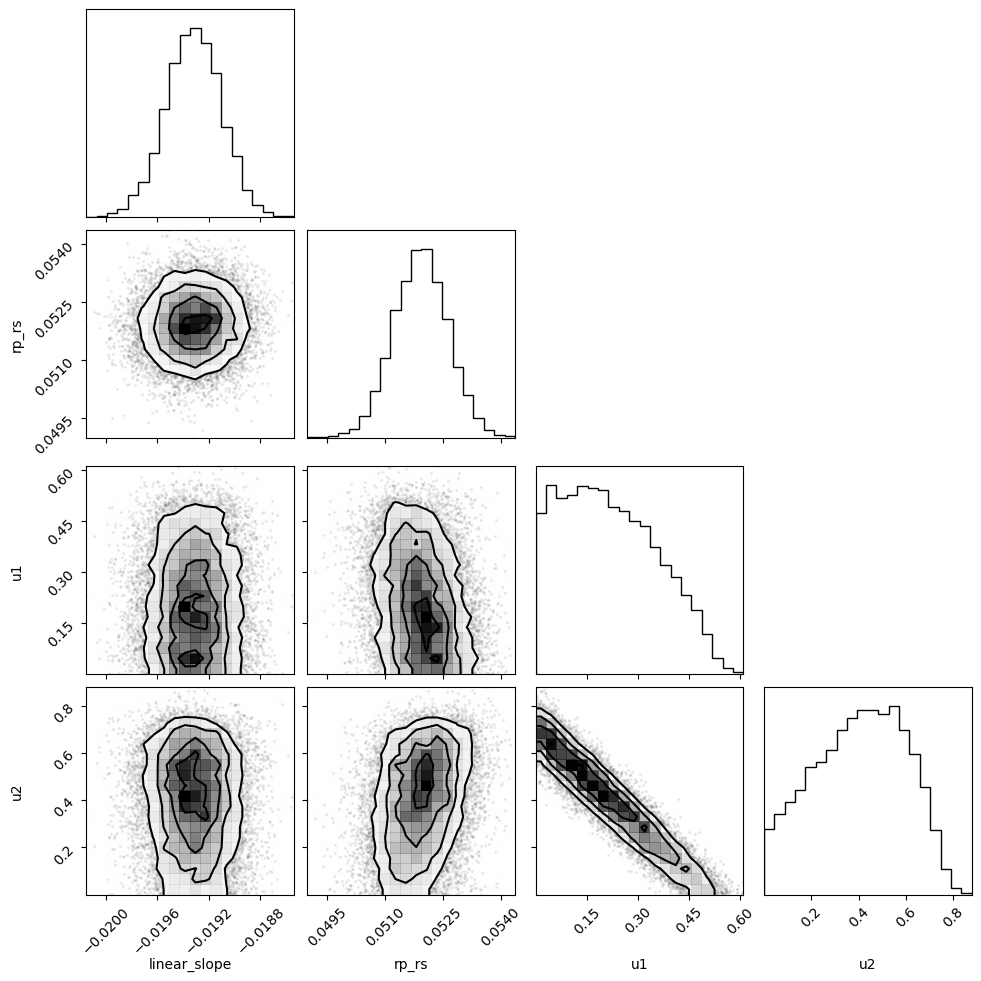

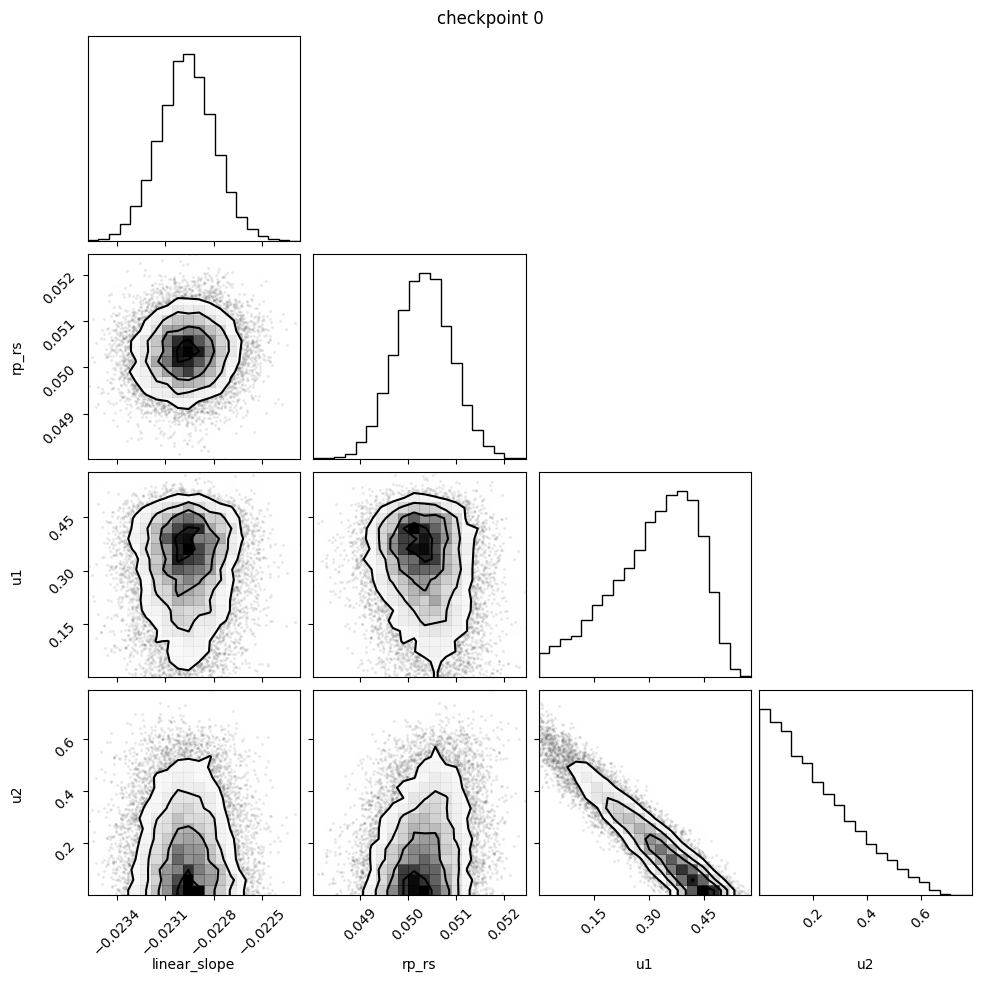


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  14163.11      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7197.02      1.00
            u1      0.31      0.12      0.33      0.12      0.49   3535.41      1.00
            u2      0.20      0.15      0.17      0.00      0.43   3453.45      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.023  0.000  -0.023   -0.023        0.000   14540.616   
rp_rs          0.050  0.000   0.049    0.051        0.000    8809.182   
u1             0.331  0.081   0.057    0.487        0.002    5140.867   
u2             0.173  0.107   0.009    0.544        0.003    5037.971   

              ess_tail  r_hat  
linear_slope    9159.0    1.0  
rp_rs           7669.0    1.0  
u1              3109.0    1.0  
u2              3793.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


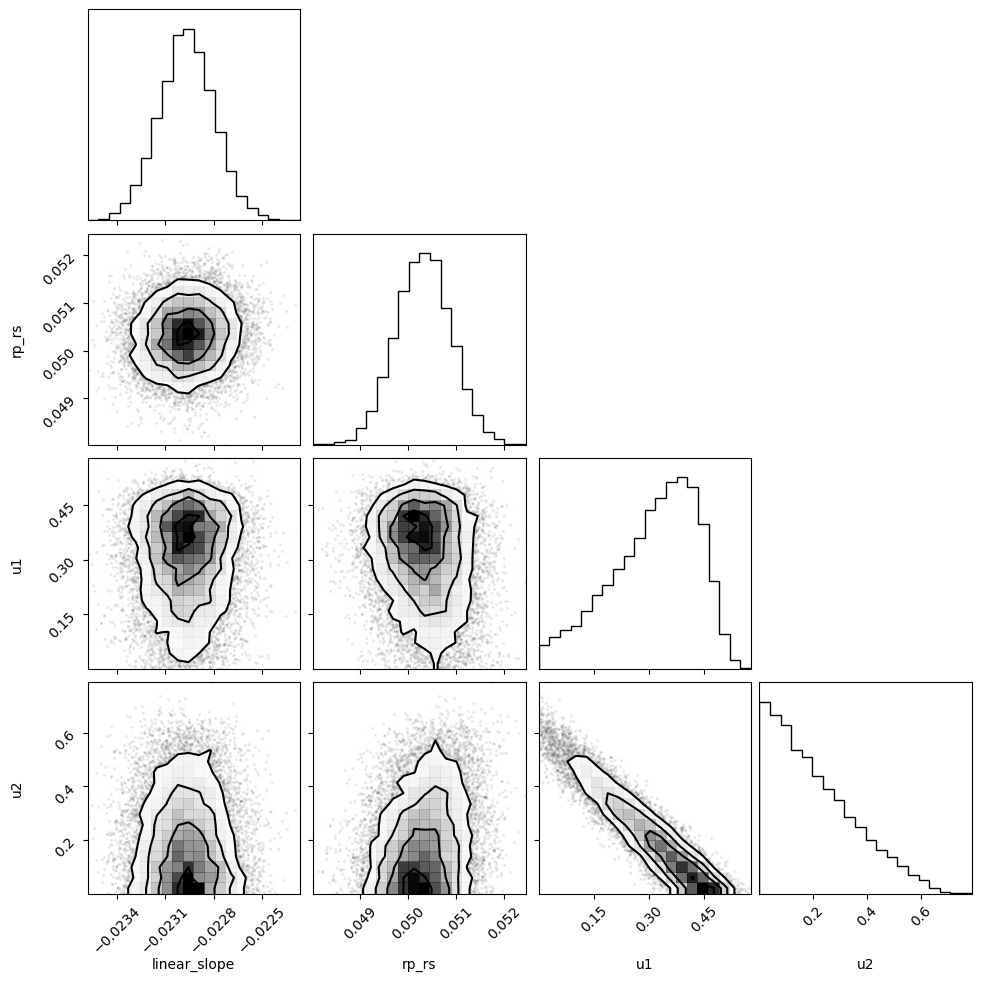

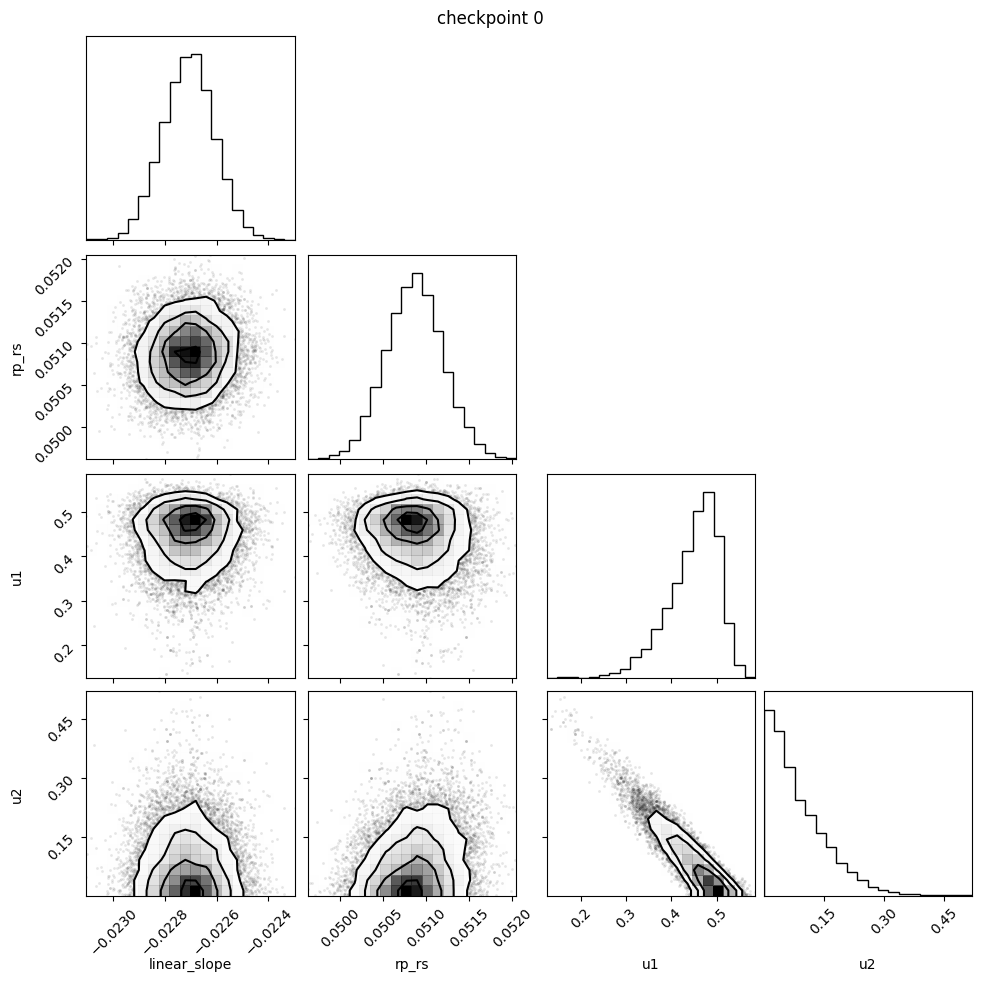


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  14095.80      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7230.16      1.00
            u1      0.45      0.06      0.46      0.36      0.53    677.22      1.02
            u2      0.09      0.07      0.07      0.00      0.19    616.91      1.02

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.023  0.000  -0.023   -0.023        0.000   14300.971   
rp_rs          0.051  0.000   0.050    0.052        0.000    8453.000   
u1             0.458  0.035   0.321    0.530        0.002     679.236   
u2             0.067  0.044   0.003    0.255        0.004     545.479   

              ess_tail  r_hat  
linear_slope   10037.0   1.00  
rp_rs           7791.0   1.00  
u1              1818.0   1.02  
u2              1776.0   1.02  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


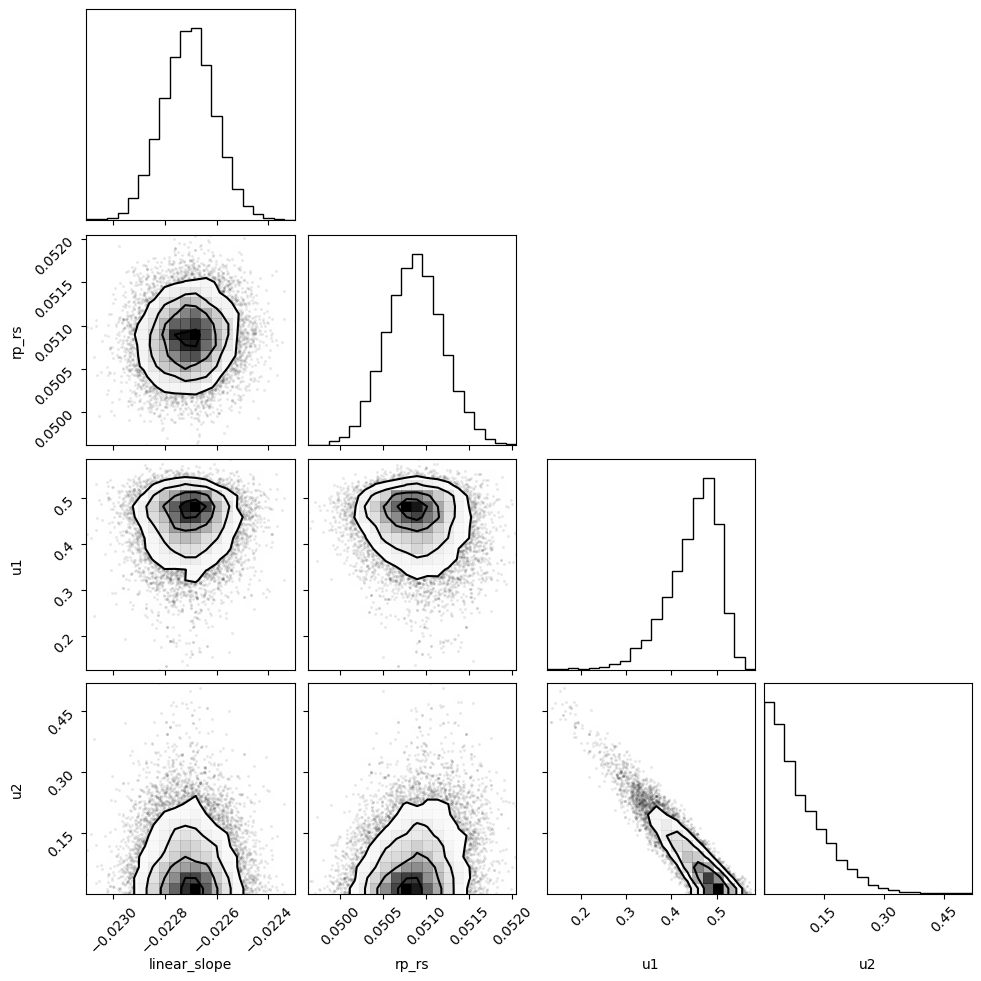

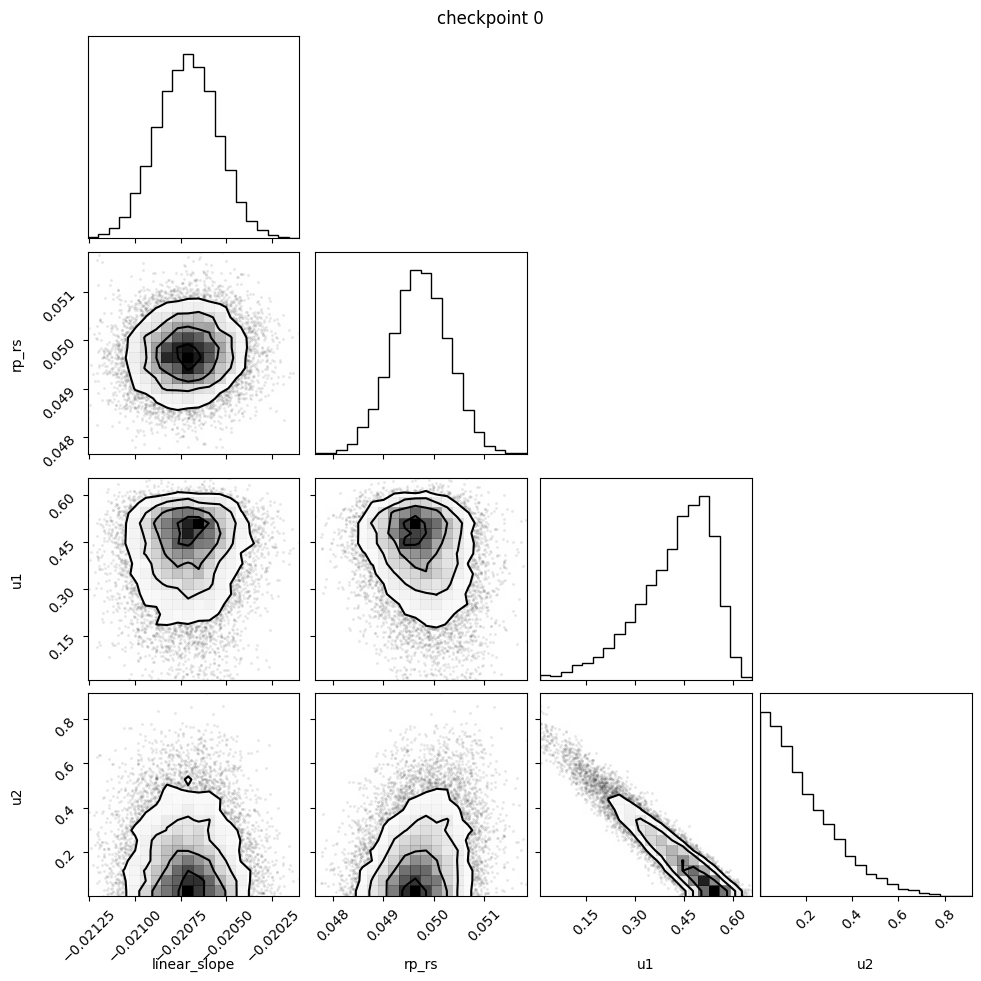


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  11823.47      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7756.36      1.00
            u1      0.42      0.12      0.44      0.24      0.59   3095.60      1.00
            u2      0.19      0.15      0.15      0.00      0.41   3020.12      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.021  0.000  -0.021   -0.020        0.000   13528.498   
rp_rs          0.050  0.000   0.049    0.051        0.000    9023.276   
u1             0.444  0.074   0.153    0.581        0.002    4766.555   
u2             0.152  0.095   0.009    0.547        0.003    4631.434   

              ess_tail  r_hat  
linear_slope    8725.0    1.0  
rp_rs           7379.0    1.0  
u1              3493.0    1.0  
u2              3641.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


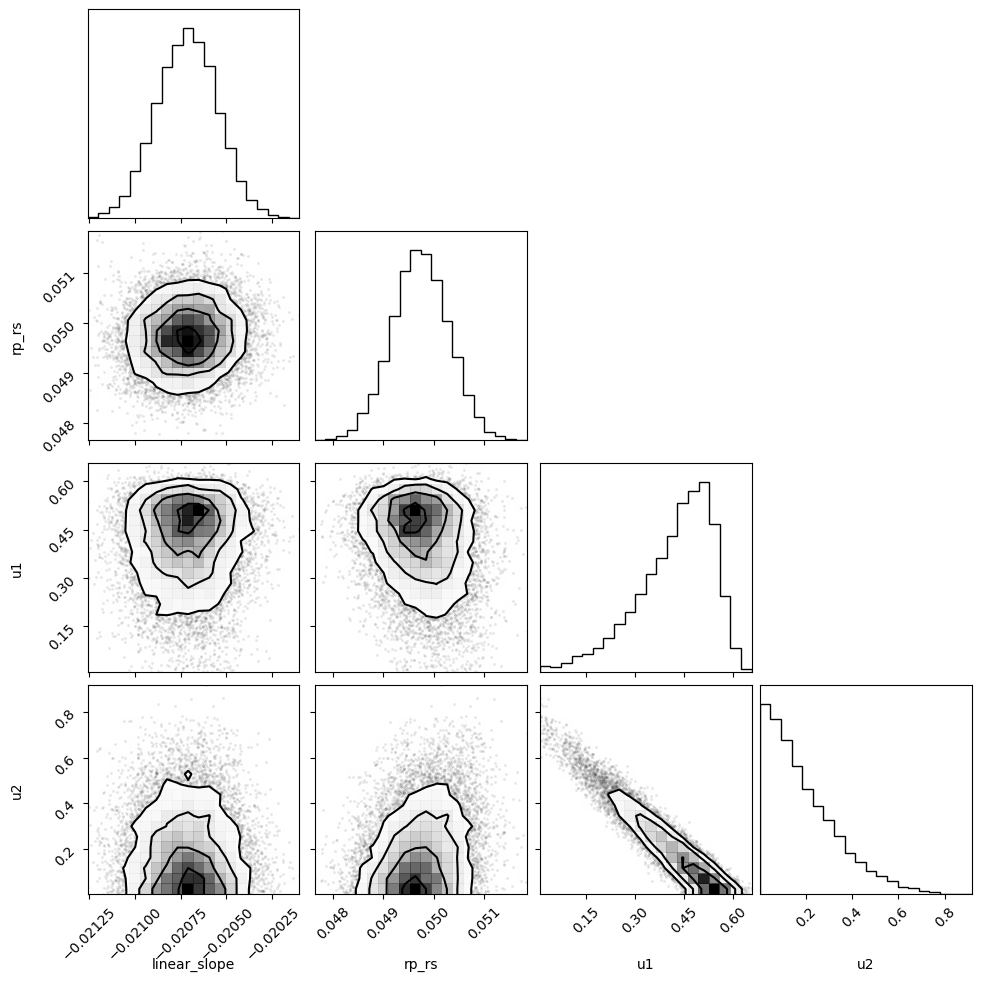

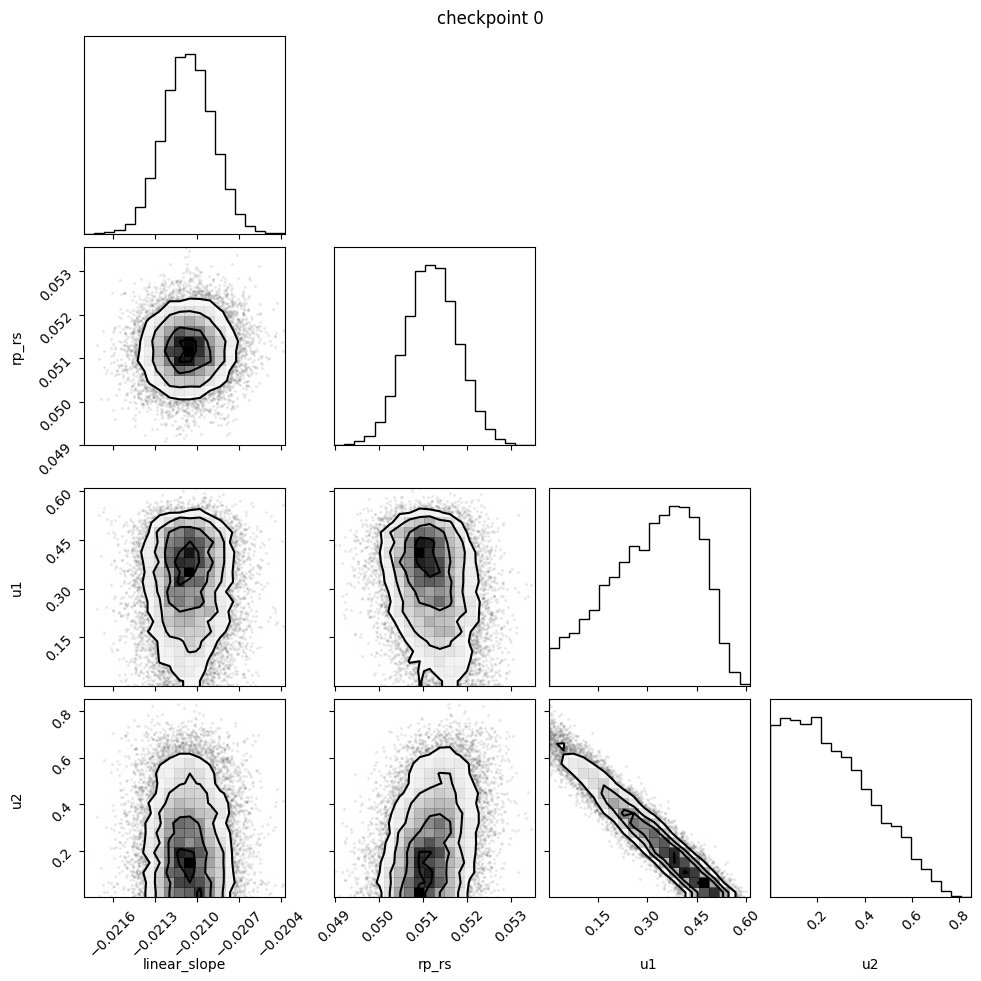


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12724.55      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6520.70      1.00
            u1      0.31      0.13      0.33      0.10      0.52   3665.17      1.00
            u2      0.26      0.18      0.24      0.00      0.53   3630.25      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.021  0.000  -0.021   -0.021        0.000   13055.418   
rp_rs          0.051  0.000   0.050    0.052        0.000    7833.261   
u1             0.331  0.098   0.045    0.518        0.002    5365.397   
u2             0.238  0.131   0.014    0.632        0.004    5348.106   

              ess_tail  r_hat  
linear_slope    9578.0    1.0  
rp_rs           6981.0    1.0  
u1              2746.0    1.0  
u2              3205.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


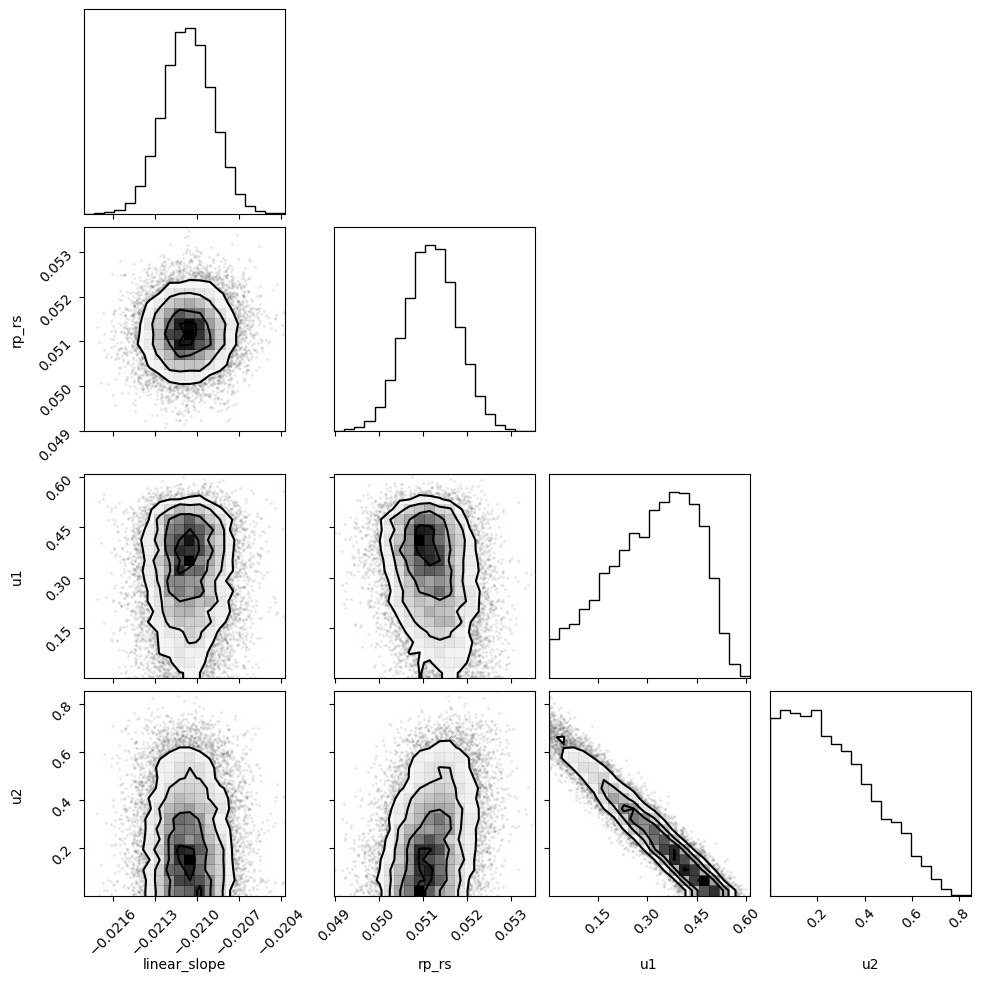

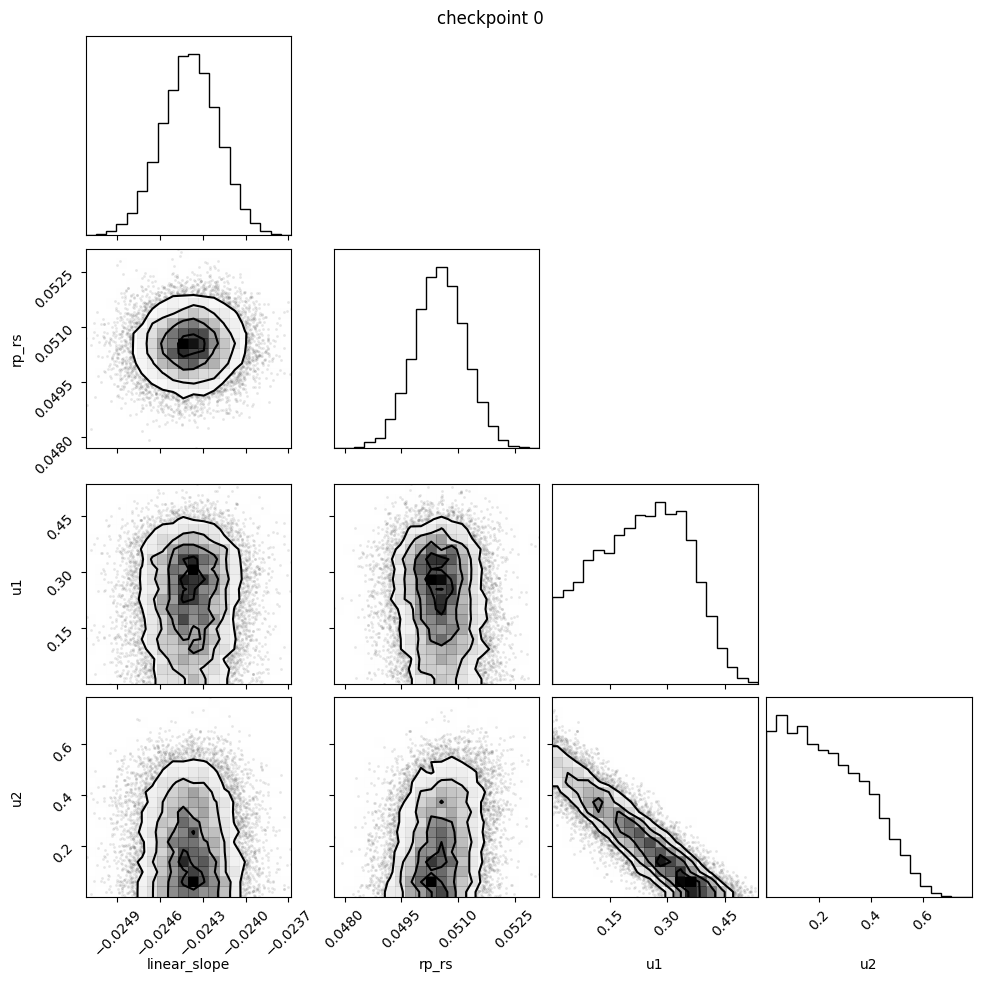


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12451.33      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8182.74      1.00
            u1      0.23      0.12      0.23      0.03      0.40   3514.18      1.00
            u2      0.23      0.15      0.22      0.00      0.45   3572.21      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.024  0.000  -0.025   -0.024        0.000   13013.535   
rp_rs          0.051  0.000   0.049    0.052        0.000    9168.344   
u1             0.235  0.091   0.021    0.425        0.002    4784.086   
u2             0.217  0.120   0.016    0.532        0.004    4751.463   

              ess_tail  r_hat  
linear_slope    9339.0    1.0  
rp_rs           8020.0    1.0  
u1              3508.0    1.0  
u2              4372.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


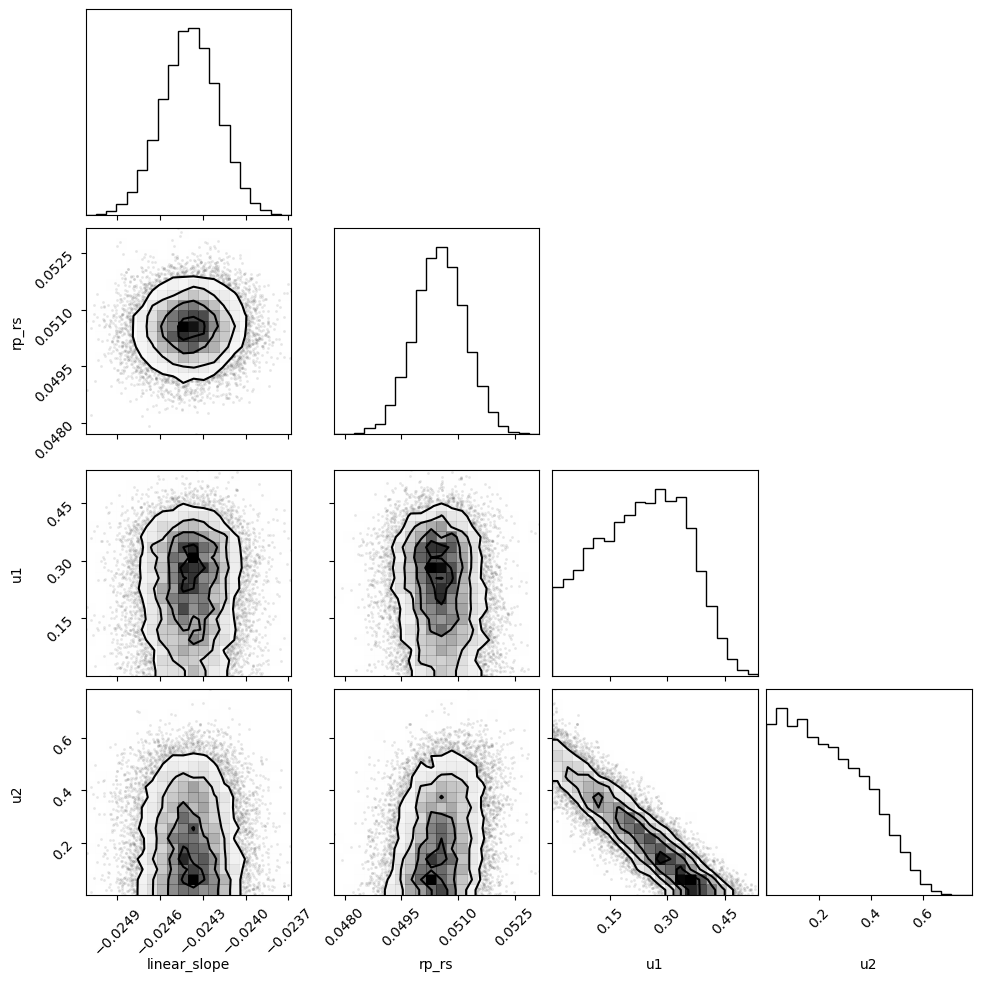

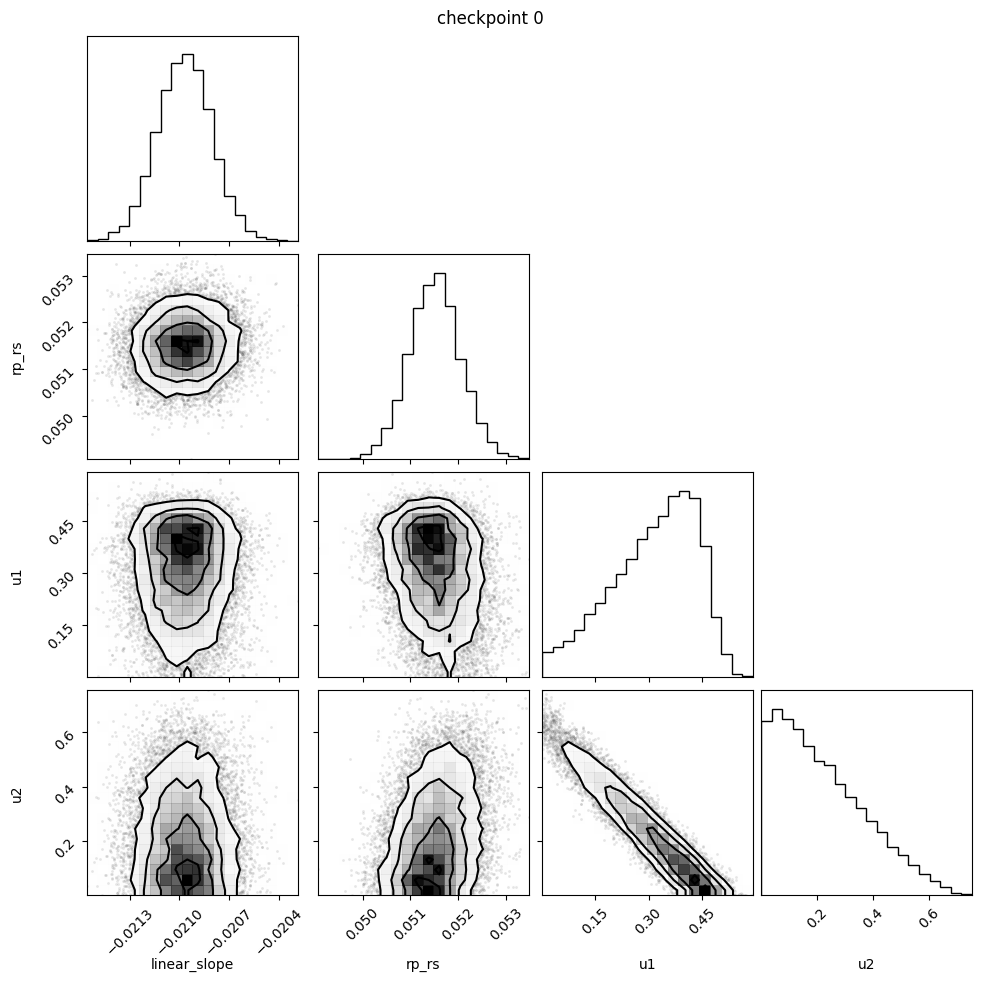


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  11398.20      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7475.73      1.00
            u1      0.31      0.12      0.33      0.12      0.50   3214.83      1.00
            u2      0.22      0.16      0.19      0.00      0.45   3178.84      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.021  0.000  -0.021   -0.021        0.000   13001.798   
rp_rs          0.052  0.000   0.050    0.053        0.000    8307.071   
u1             0.331  0.084   0.059    0.489        0.003    4820.846   
u2             0.191  0.112   0.012    0.558        0.003    4859.378   

              ess_tail  r_hat  
linear_slope    8294.0    1.0  
rp_rs           8228.0    1.0  
u1              2686.0    1.0  
u2              3761.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


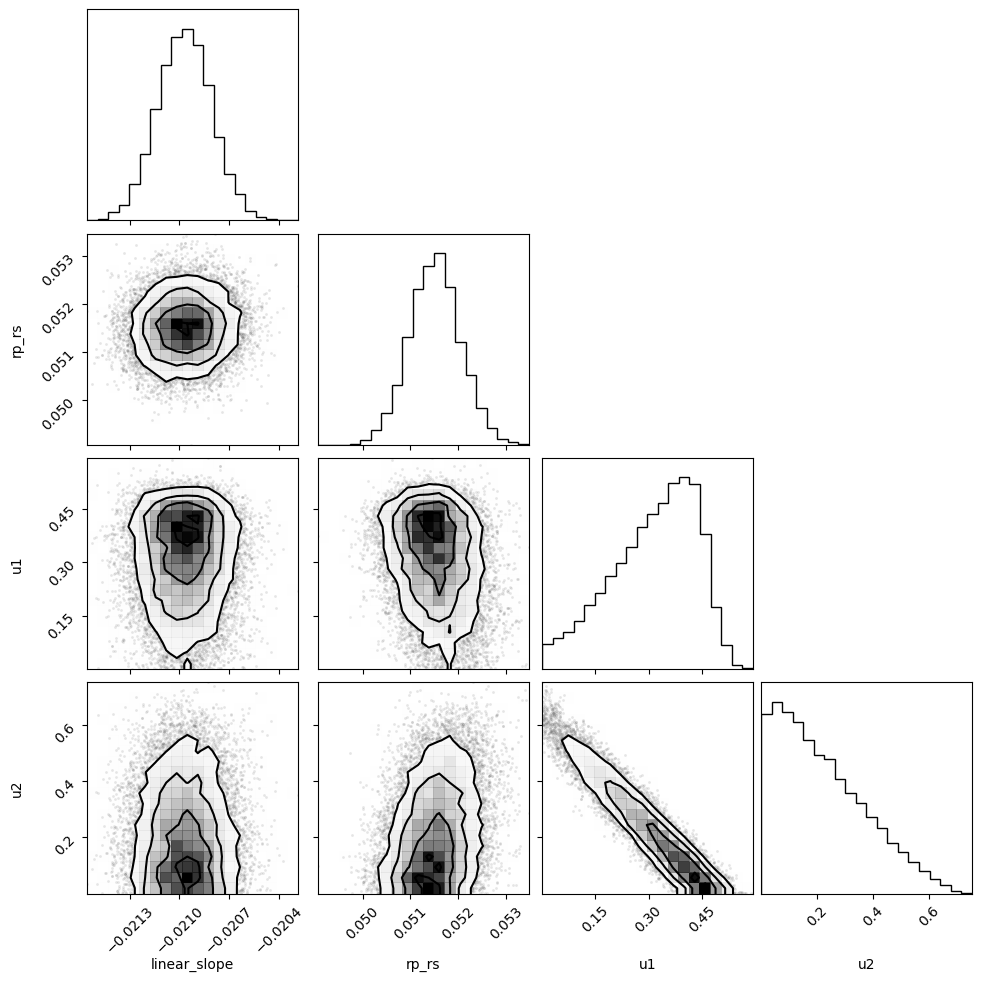

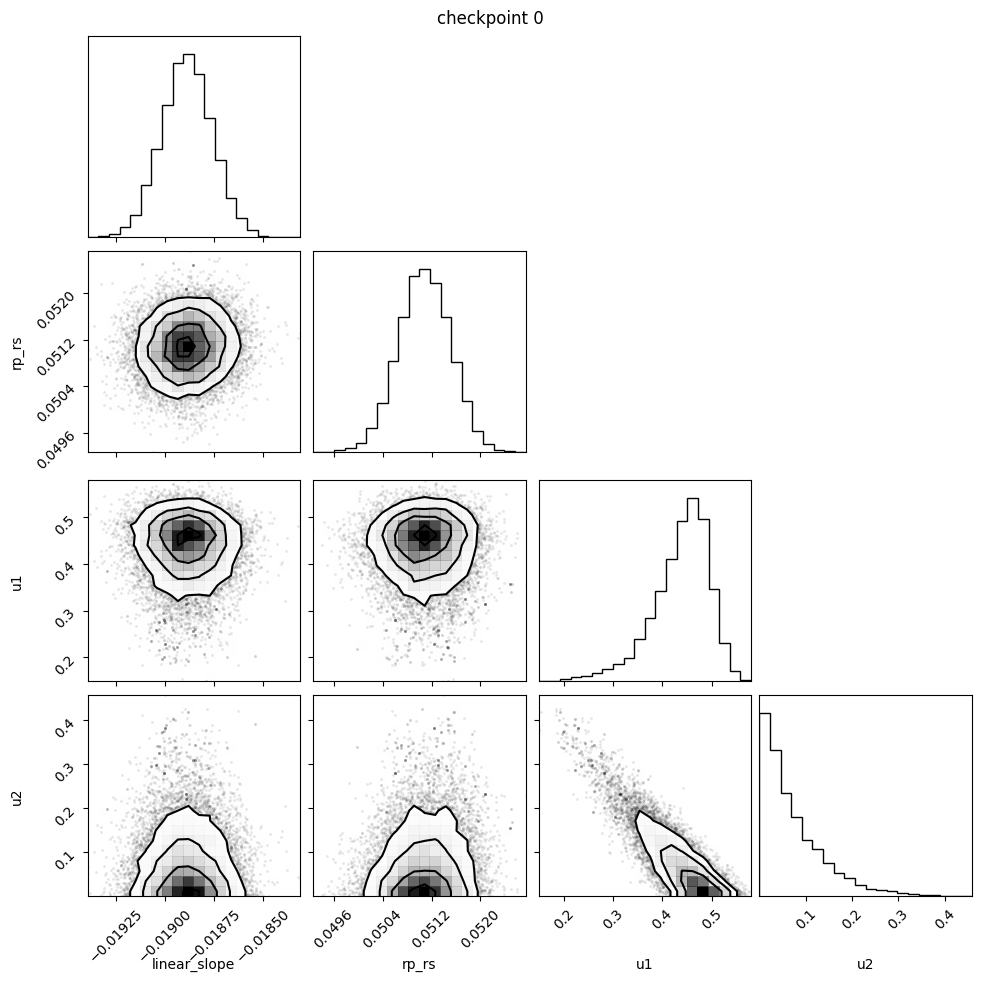


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12761.81      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7589.45      1.00
            u1      0.44      0.06      0.45      0.34      0.52    907.44      1.01
            u2      0.07      0.07      0.05      0.00      0.17    872.27      1.01

Number of divergences: 1
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.019  0.000  -0.019   -0.019        0.000   13598.594   
rp_rs          0.051  0.000   0.050    0.052        0.000    8075.588   
u1             0.447  0.035   0.296    0.523        0.001    4558.657   
u2             0.053  0.036   0.002    0.251        0.001    4271.264   

              ess_tail  r_hat  
linear_slope    8720.0   1.00  
rp_rs           8308.0   1.00  
u1               635.0   1.01  
u2               877.0   1.01  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


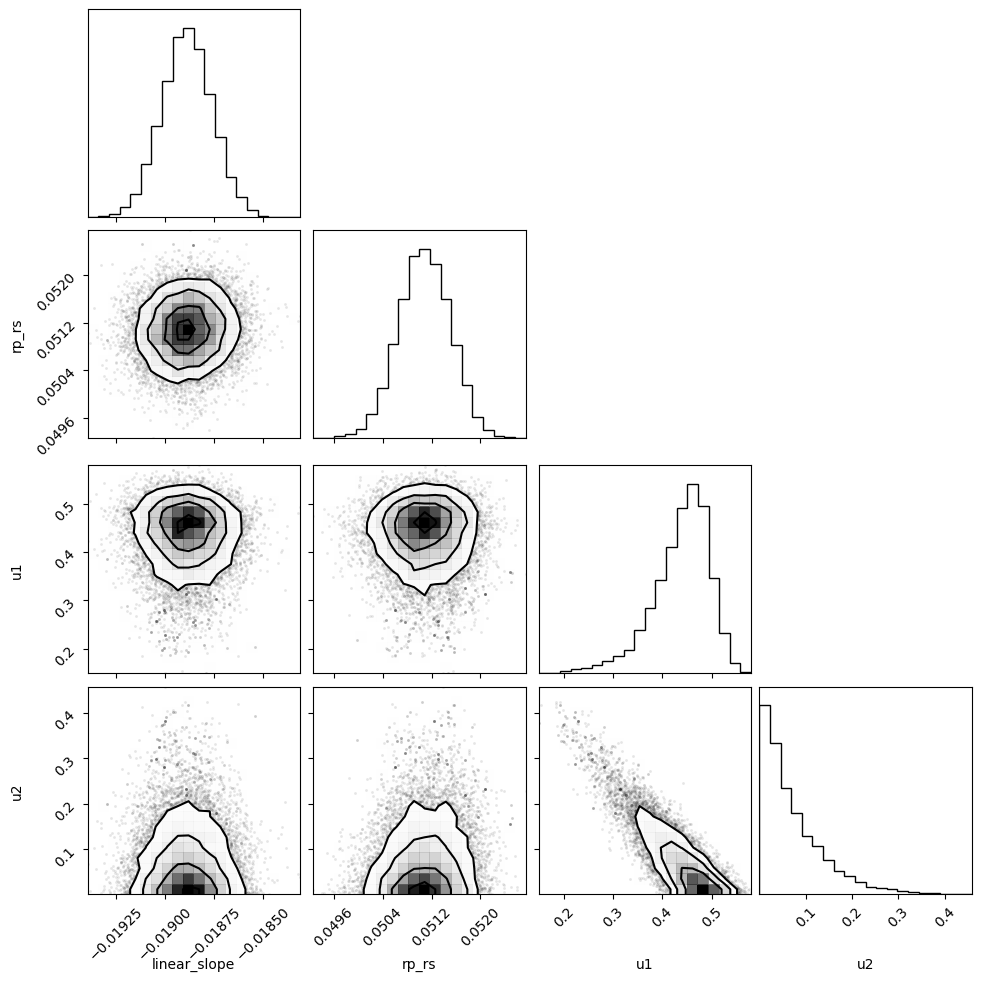

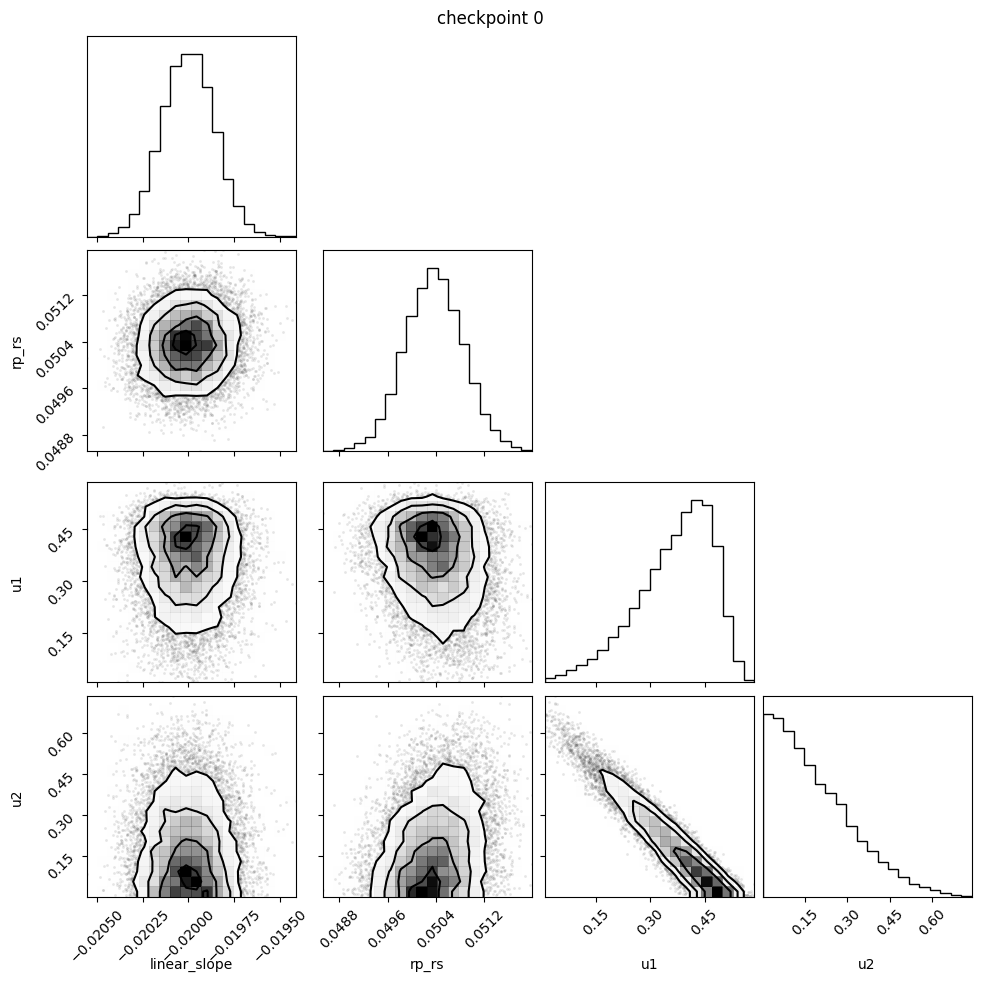


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  11739.95      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6904.80      1.00
            u1      0.37      0.11      0.38      0.20      0.52   3752.50      1.00
            u2      0.18      0.14      0.15      0.00      0.39   3662.21      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.020  0.000  -0.020   -0.020        0.000   13196.983   
rp_rs          0.050  0.000   0.049    0.051        0.000    8246.178   
u1             0.384  0.070   0.130    0.516        0.002    5039.562   
u2             0.155  0.095   0.008    0.500        0.003    4887.093   

              ess_tail  r_hat  
linear_slope    8196.0    1.0  
rp_rs           7607.0    1.0  
u1              4104.0    1.0  
u2              4633.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


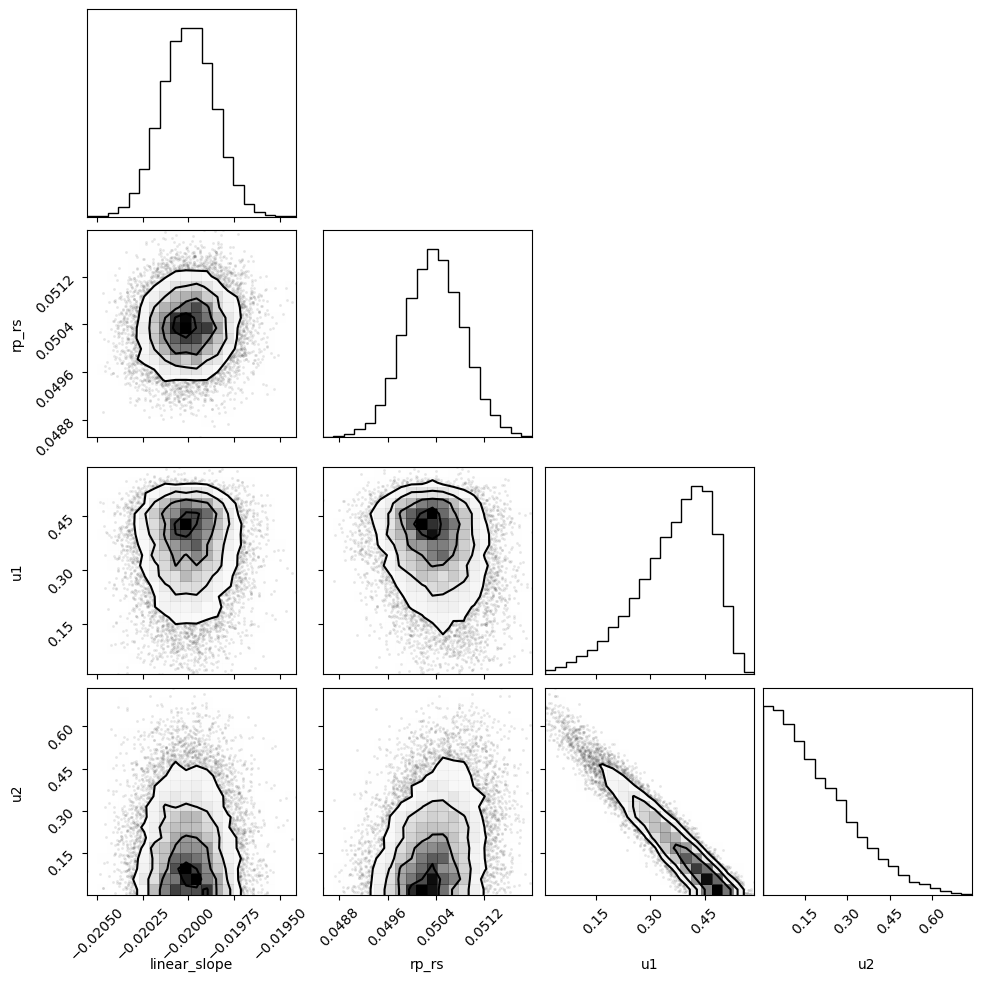

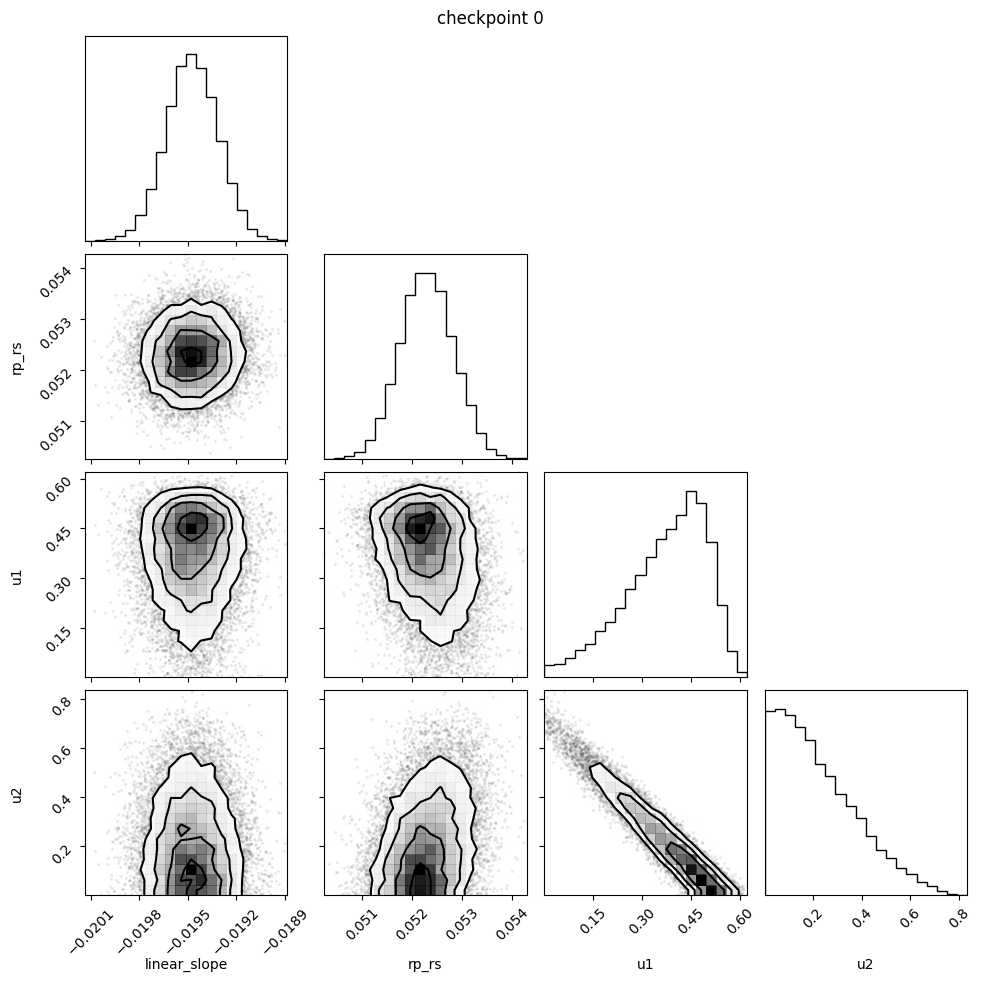


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12108.02      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7830.32      1.00
            u1      0.37      0.12      0.39      0.18      0.56   2506.05      1.00
            u2      0.22      0.16      0.19      0.00      0.46   2507.14      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.019  0.000  -0.020   -0.019        0.000   12628.798   
rp_rs          0.052  0.000   0.051    0.053        0.000    9299.424   
u1             0.393  0.083   0.100    0.546        0.003    3946.486   
u2             0.190  0.112   0.012    0.589        0.004    3786.491   

              ess_tail  r_hat  
linear_slope    9167.0    1.0  
rp_rs           8544.0    1.0  
u1              2426.0    1.0  
u2              2751.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


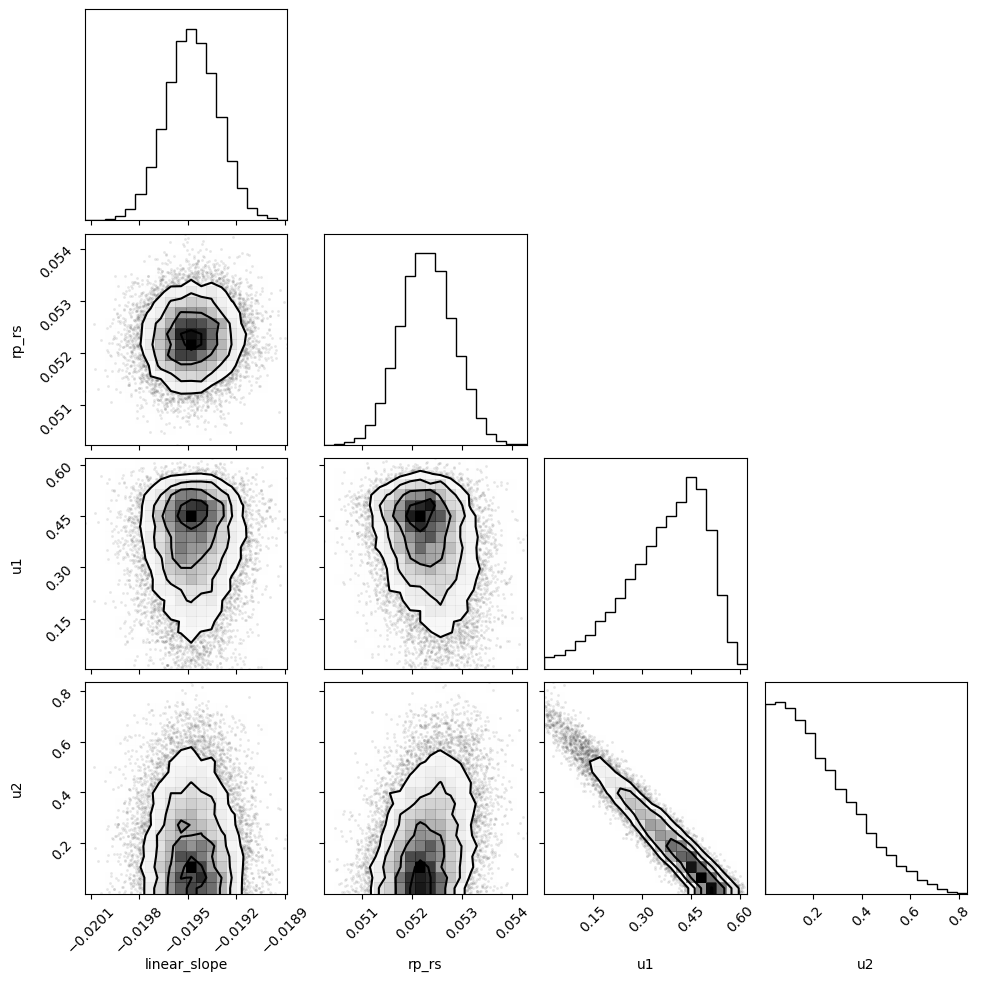

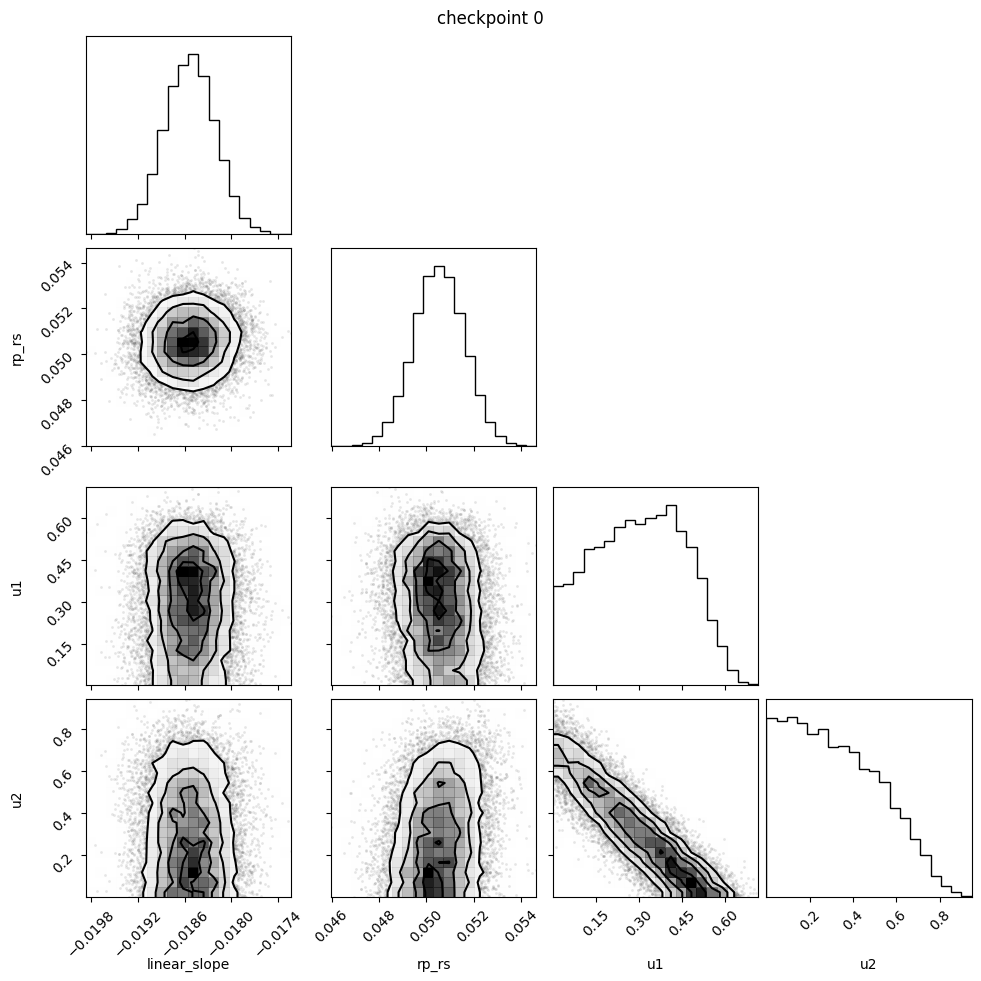


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  10492.87      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   9260.47      1.00
            u1      0.30      0.16      0.30      0.01      0.51   5610.14      1.00
            u2      0.32      0.21      0.30      0.00      0.62   5496.36      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.019  0.000  -0.019   -0.018        0.000   12225.818   
rp_rs          0.051  0.001   0.049    0.053        0.000   10033.714   
u1             0.303  0.123   0.025    0.567        0.003    7086.478   
u2             0.296  0.165   0.017    0.726        0.004    7069.396   

              ess_tail  r_hat  
linear_slope    7285.0    1.0  
rp_rs           8745.0    1.0  
u1              4754.0    1.0  
u2              5970.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


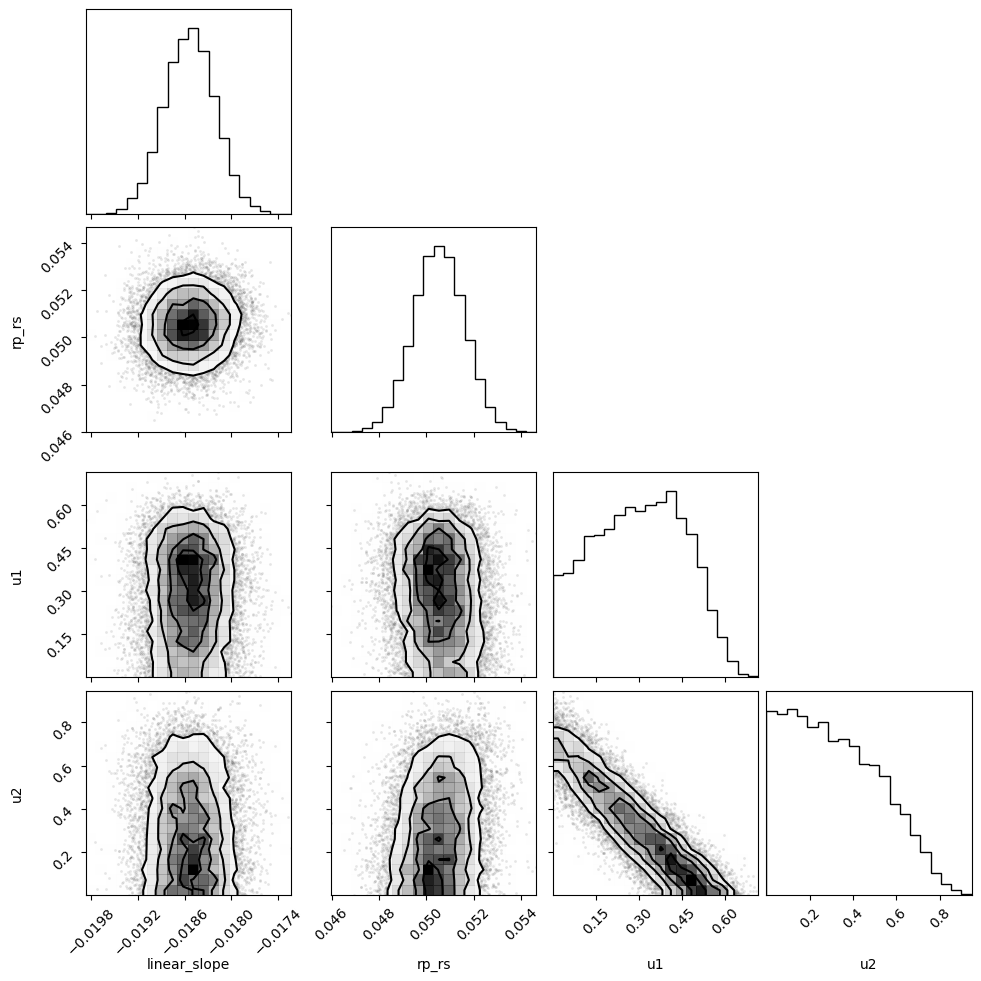

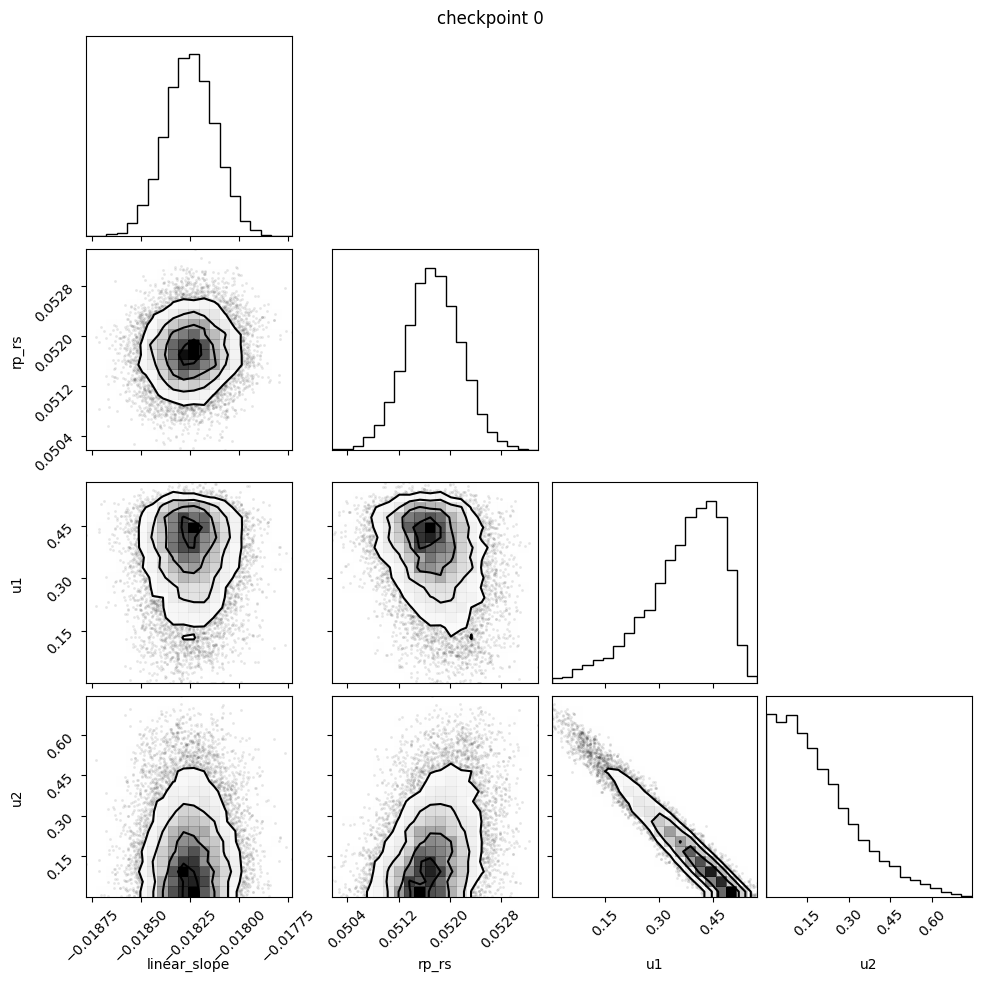


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  12067.86      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   6188.82      1.00
            u1      0.37      0.11      0.39      0.21      0.53    450.44      1.03
            u2      0.19      0.14      0.16      0.00      0.40    432.73      1.03

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.018  0.000  -0.018   -0.018        0.000   12943.986   
rp_rs          0.052  0.000   0.051    0.053        0.000    8000.079   
u1             0.388  0.069   0.120    0.516        0.005     723.555   
u2             0.158  0.092   0.008    0.523        0.007     650.505   

              ess_tail  r_hat  
linear_slope    9170.0   1.00  
rp_rs           6781.0   1.00  
u1               466.0   1.03  
u2               609.0   1.03  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


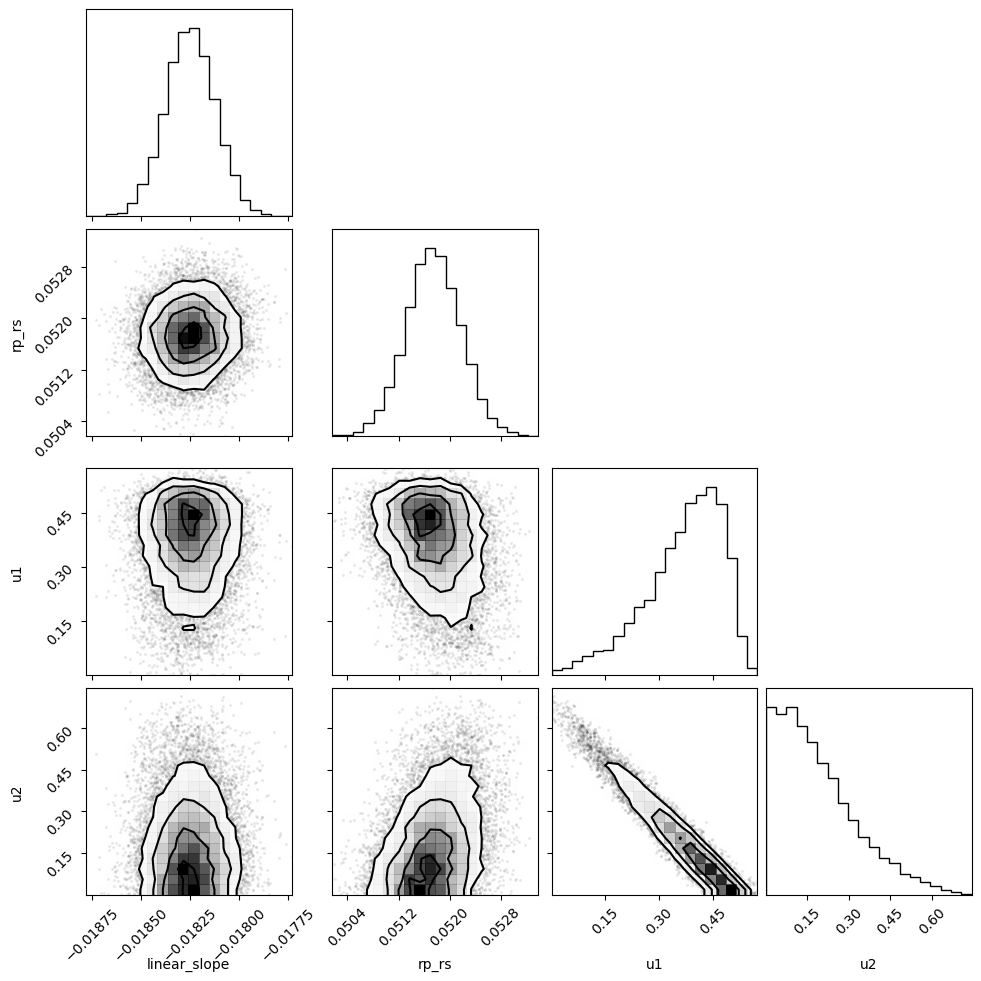

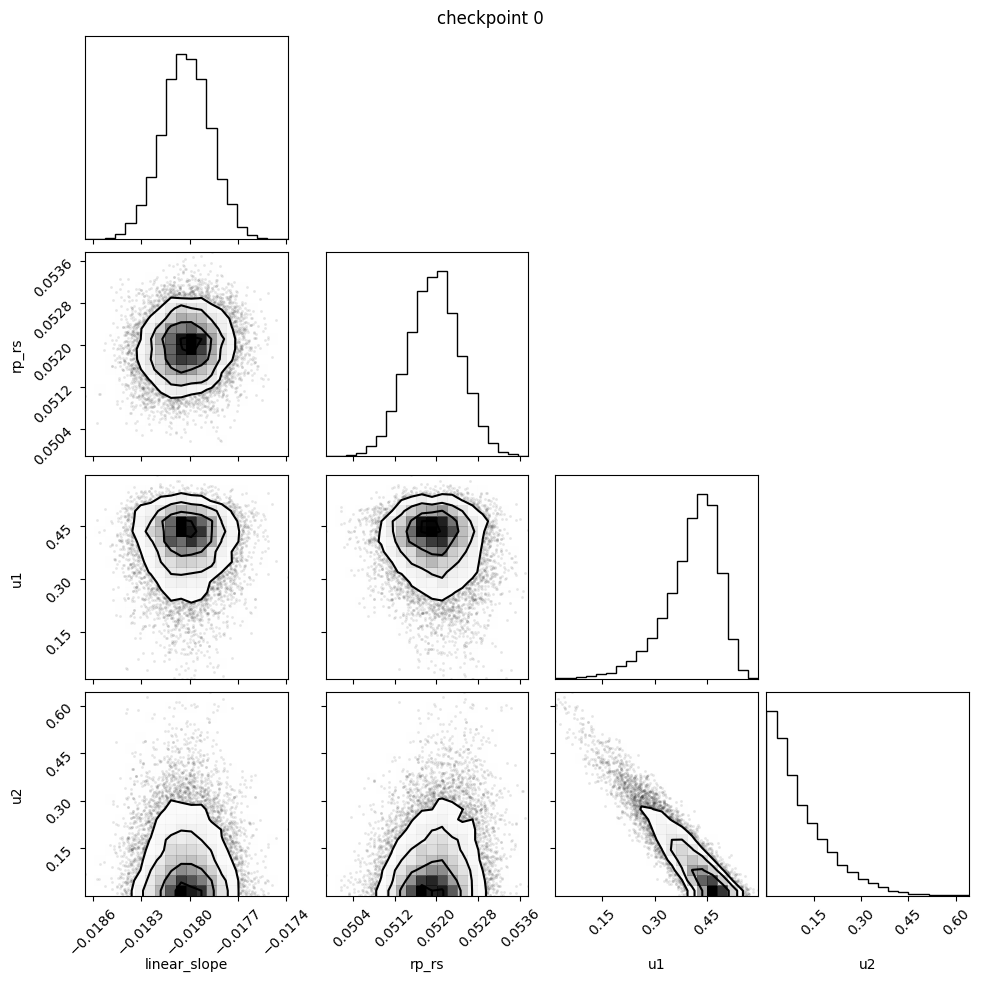


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  13083.53      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   8139.61      1.00
            u1      0.40      0.08      0.42      0.28      0.53   2944.29      1.00
            u2      0.11      0.10      0.08      0.00      0.25   2823.25      1.00

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.018  0.000  -0.018   -0.018        0.000   12799.653   
rp_rs          0.052  0.000   0.051    0.053        0.000    9565.780   
u1             0.418  0.047   0.219    0.516        0.001    4934.319   
u2             0.083  0.055   0.004    0.352        0.002    5111.477   

              ess_tail  r_hat  
linear_slope    9133.0    1.0  
rp_rs           8159.0    1.0  
u1              3146.0    1.0  
u2              3329.0    1.0  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


  0%|          | 0/2 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]




Begin 2000 samples with 2 checkpoints





  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


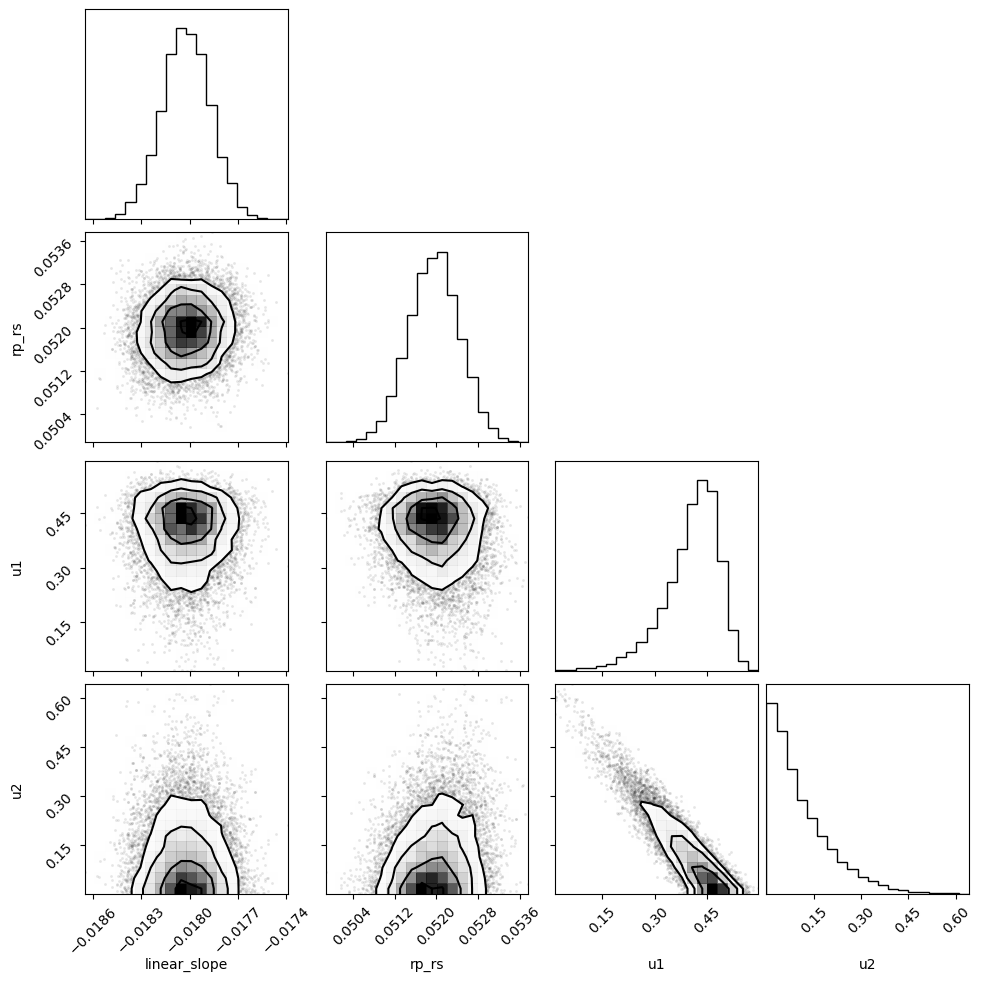

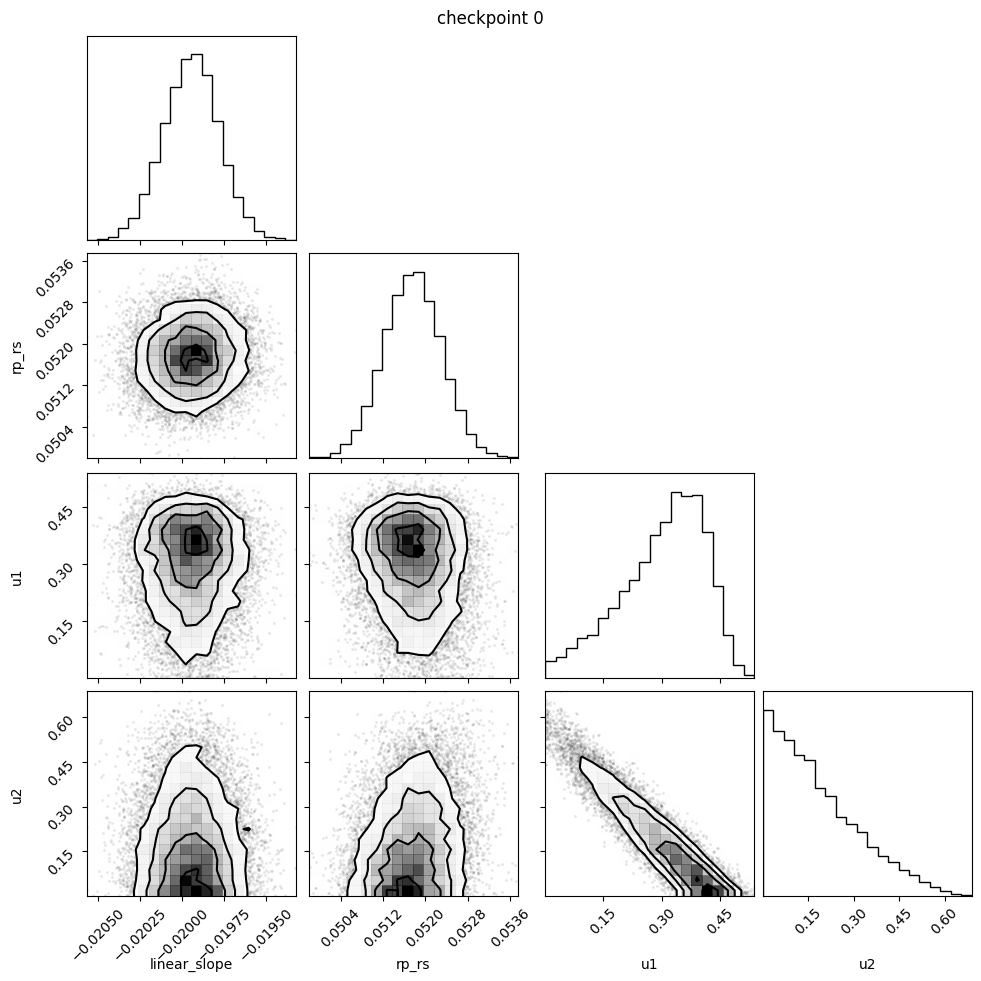


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  linear_slope     -0.02      0.00     -0.02     -0.02     -0.02  11607.89      1.00
         rp_rs      0.05      0.00      0.05      0.05      0.05   7756.35      1.00
            u1      0.30      0.11      0.32      0.13      0.47   1736.89      1.01
            u2      0.18      0.14      0.15      0.00      0.38   1737.44      1.01

Number of divergences: 0
              median    mad  eti_3%  eti_97%  mcse_median  ess_median  \
linear_slope  -0.020  0.000  -0.020   -0.020        0.000   12957.808   
rp_rs          0.052  0.000   0.051    0.053        0.000    9042.292   
u1             0.321  0.072   0.068    0.461        0.002    3559.241   
u2             0.151  0.094   0.009    0.494        0.003    3283.446   

              ess_tail  r_hat  
linear_slope    8896.0   1.00  
rp_rs           7957.0   1.00  
u1              1355.0   1.01  
u2              1843.0   1.01  


/opt/anaconda3/envs/fleckopy/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


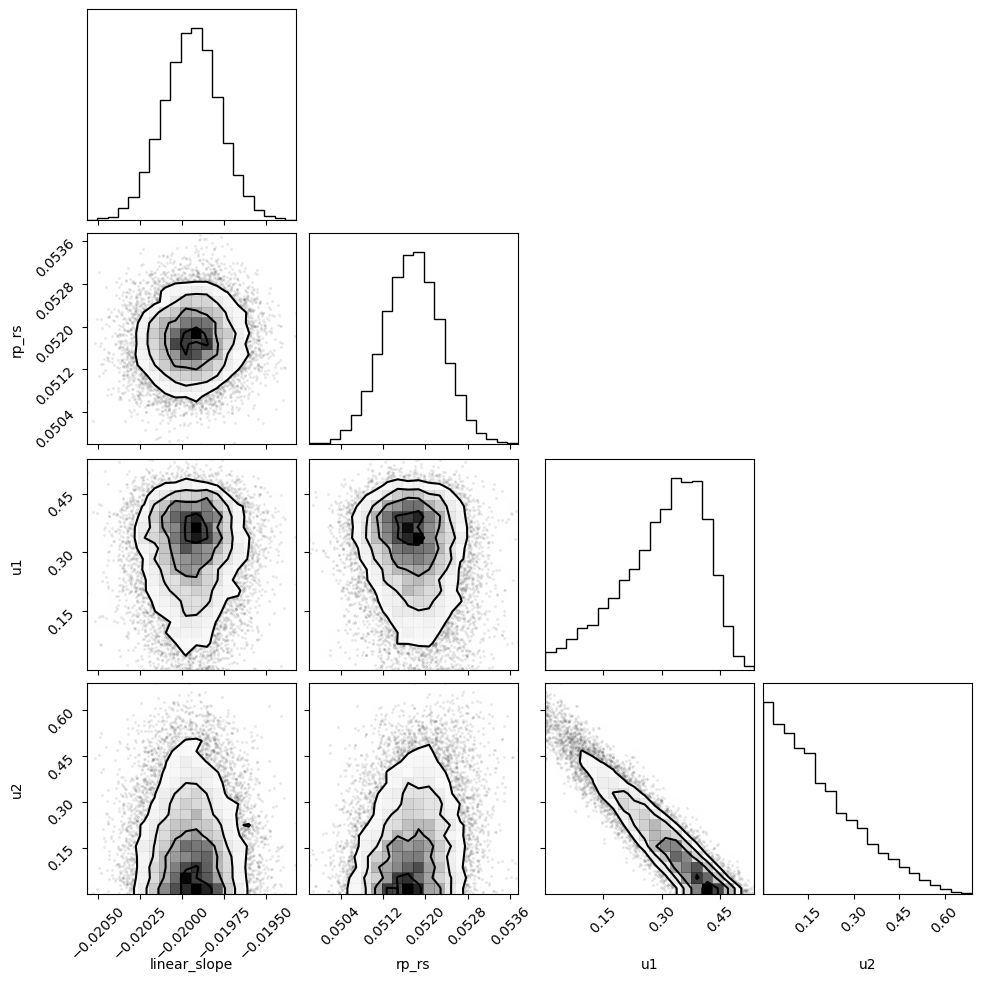

In [6]:
n_warmup = 2_00
n_samples = 2_000
n_chains = 7
n_checks = 1
# lc_index = 1 #0 to 27 for S22

for lc_index in [0,1,2,3,4,5,6,7,
                8,9,10,11,12,13,
                 14,15,16,17,18,
                19,20,21,22,23,24,25,26,27]:

    model_designation = f'{visit}_{n_samples}samples_{n_chains}chains_lc{lc_index}'
    data_unc = jax_rel_err[lc_index,:]
    relative_flux =  jax_flux[lc_index,:]
    
    rng_key = PRNGKey(42)
    
    sampler = NUTS(
        numpyro_model,
        dense_mass=False
    )
    
    mcmc = MCMCWithCheckpoints(
        sampler, 
        num_warmup=n_warmup, 
        num_samples=n_samples,
        num_chains=n_chains
    )
    
    mcmc.run_checkpoints(rng_key, n_checkpoints=n_checks, on_checkpoint=post_batch_viz_save)
    
    mcmc.print_summary()                                                                        
    
    # arviz converts a numpyro MCMC object to an `InferenceData` object based on xarray:
    result = arviz.from_numpyro(mcmc)
    
    
    median_params = arviz.summary(result,stat_focus='median')
    print(median_params)
    'Save the result'
    result.to_netcdf(f'../data/samples/{model_designation}')
    'Print the summary'
    arviz.summary(result)
    
    'Make a corner plot'
    corner.corner(
        result, #var_names=['~offset_G102',
                           # r'~$\beta_{\rm G102}$',
                           # r'~$\beta_{\rm G141}$',
                           # r'~$\sigma_{\rm conv}$'],
        # quiet=True, 
    );
    plt.savefig(f'../figs/{model_designation}_corner.png',dpi=200)
    
    'Examine the Leave-One-Out (LOO) summary'
    loo = arviz.loo(result, pointwise=True)
    loo

0.8103 0.8050 0.8157 0.0502 0.0010
0.8194 0.8157 0.8231 0.0487 0.0012
0.8267 0.8231 0.8304 0.0531 0.0009
0.8501 0.8304 0.8698 0.0476 0.0014
0.8747 0.8698 0.8796 0.0524 0.0006
0.8845 0.8796 0.8894 0.0507 0.0007
0.8968 0.8894 0.9042 0.0501 0.0005
0.9079 0.9042 0.9116 0.0520 0.0007
0.9165 0.9116 0.9214 0.0522 0.0006
0.9275 0.9214 0.9337 0.0517 0.0005
0.9411 0.9337 0.9484 0.0509 0.0005
0.9546 0.9484 0.9607 0.0516 0.0008
0.9644 0.9607 0.9681 0.0506 0.0006
0.9706 0.9681 0.9730 0.0507 0.0008
0.9755 0.9730 0.9779 0.0519 0.0007
0.9816 0.9779 0.9853 0.0503 0.0006
1.0001 0.9853 1.0148 0.0509 0.0003
1.0197 1.0148 1.0247 0.0497 0.0006
1.0283 1.0247 1.0320 0.0512 0.0006
1.0345 1.0320 1.0369 0.0505 0.0007
1.0406 1.0369 1.0443 0.0515 0.0005
1.0505 1.0443 1.0566 0.0511 0.0004
1.0615 1.0566 1.0664 0.0504 0.0005
1.0701 1.0664 1.0738 0.0523 0.0005
1.0873 1.0738 1.1009 0.0505 0.0011
1.1070 1.1009 1.1132 0.0517 0.0004
1.1181 1.1132 1.1230 0.0520 0.0005
1.1265 1.1230 1.1300 0.0518 0.0005


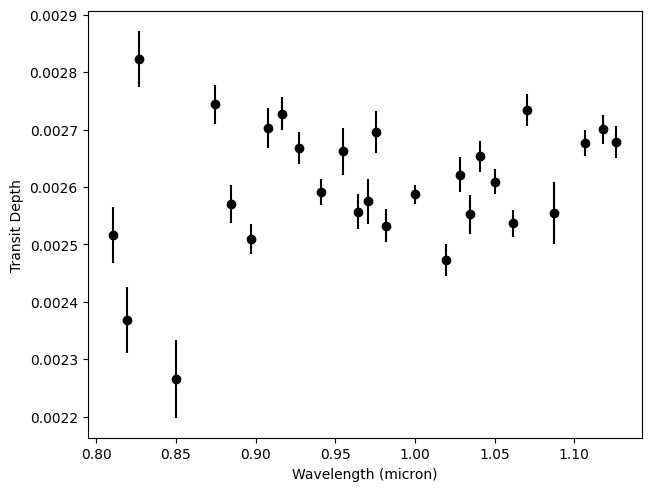

In [7]:
n_warmup = 2_00
n_samples = 2_000
n_chains = 7
n_checks = 1
# lc_index = 1 #0 to 27 for S22

plt.figure()
plt.xlabel('Wavelength (micron)')
plt.ylabel('Transit Depth')

for lc_index in [0,1,2,3,4,5,6,7,
                8,9,10,11,12,13,
                 14,15,16,17,18,
                19,20,21,22,23,24,25,26,27]:

    model_designation = f'{visit}_{n_samples}samples_{n_chains}chains_lc{lc_index}'
    data_unc = jax_rel_err[lc_index,:]
    relative_flux =  jax_flux[lc_index,:]

    result = arviz.InferenceData.from_netcdf(f'../data/samples/{model_designation}')

    # Extract posterior samples
    posterior = result.posterior
    
    # Print median and standard deviation for all parameters with high precision
    # print(f"\n=== Results for lc_index {lc_index} ===")
    
    # Calculate median and std for all parameters
    param_medians = posterior.median()
    param_stds = posterior.std()
    
    # Print each parameter with the required precision
    # for var_name in posterior.data_vars:
    median_val = float(param_medians['rp_rs'].values)
    std_val = float(param_stds['rp_rs'].values)
    print(f"{data_wavelengths[lc_index]:.4f} {speclc_bin_edges.value[lc_index]:.4f} {speclc_bin_edges.value[lc_index+1]:.4f} {median_val:.4f} {std_val:.4f}")
    rel_err = std_val/median_val
    
    plt.errorbar(data_wavelengths[lc_index], median_val**2, yerr=rel_err * median_val**2,fmt='o',color='k')


plt.savefig(f'../figs/{model_designation}_transmissionspec.png')